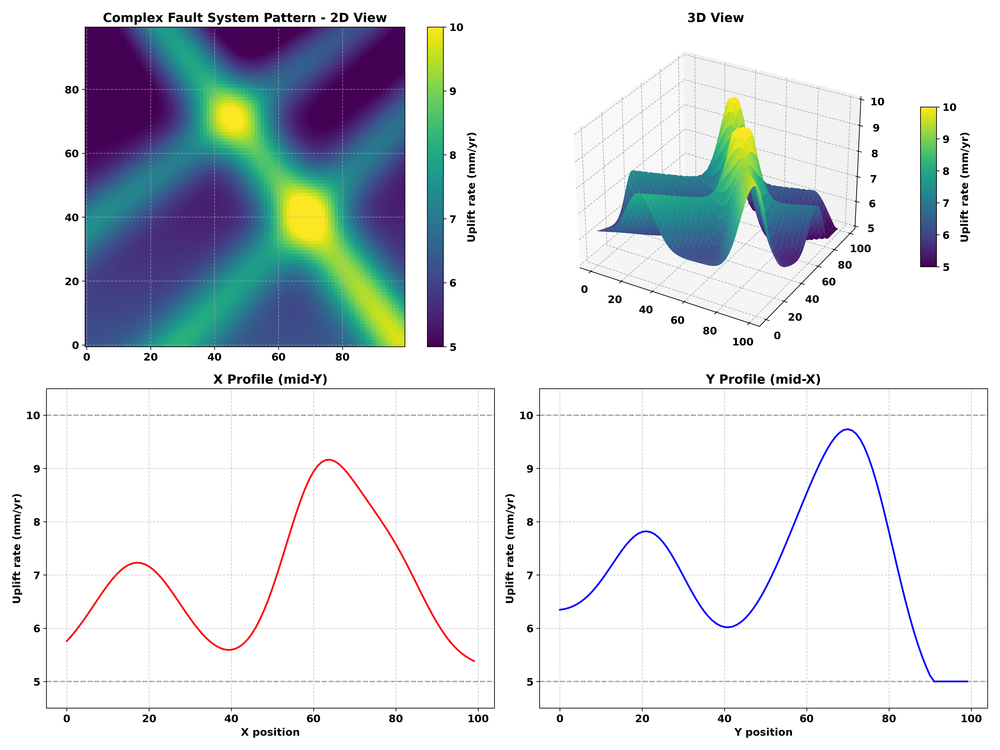

array([[6.26561987, 6.27165973, 6.2801161 , ..., 9.67460291, 9.74286597,
        9.76604994],
       [6.24166592, 6.24615925, 6.25259267, ..., 9.70911106, 9.74400563,
        9.73299799],
       [6.21914857, 6.22244994, 6.22729364, ..., 9.71872821, 9.71949401,
        9.67453807],
       ...,
       [5.        , 5.        , 5.        , ..., 5.        , 5.        ,
        5.        ],
       [5.        , 5.        , 5.        , ..., 5.        , 5.        ,
        5.        ],
       [5.        , 5.        , 5.        , ..., 5.02511577, 5.        ,
        5.        ]])

In [10]:
def create_and_visualize_synthetic_uplift(pattern='complex', shape=(100, 100), show_plot=True):
    """
    创建和可视化不同模式的合成抬升场
    
    参数:
    - pattern: 'simple', 'medium', 'complex' 或 'fault_block'
    - shape: 抬升场形状(rows, cols)
    - show_plot: 是否显示可视化结果
    
    返回:
    - uplift: 生成的抬升场数组
    """
    import numpy as np
    import matplotlib.pyplot as plt
    from scipy.ndimage import gaussian_filter
    from mpl_toolkits.mplot3d import Axes3D
    
    # 创建网格
    rows, cols = shape
    x = np.linspace(0, 1, cols)
    y = np.linspace(0, 1, rows)
    X, Y = np.meshgrid(x, y)
    
    # 根据模式生成不同的抬升场
    if pattern == 'simple':
        # 简单的高斯分布
        uplift = np.exp(-((X - 0.5)**2 + (Y - 0.5)**2) / 0.1)
        uplift = 5 + 5 * uplift  # 范围在5-10 mm/yr
        title = 'Simple Gaussian Pattern'
        
    elif pattern == 'medium':
        # 两个高斯分布的组合
        uplift1 = np.exp(-((X - 0.3)**2 + (Y - 0.3)**2) / 0.1)
        uplift2 = np.exp(-((X - 0.7)**2 + (Y - 0.7)**2) / 0.1)
        uplift = uplift1 + uplift2
        uplift = 5 + 5 * uplift / uplift.max()  # 归一化到5-10 mm/yr
        title = 'Medium Complexity Pattern'
        
    elif pattern == 'complex':
        # 模拟多断层系统
        # 主断层（走向斜切，更陡的梯度）
        main_fault = np.exp(-((0.8*X + 0.6*Y - 0.8)**2) / 0.01) * 3.5  # 减小宽度，降低幅度
        
        # 共轭断层系统（更清晰的断层带）
        conjugate_fault1 = np.exp(-((0.7*X - 0.7*Y - 0.2)**2) / 0.008) * 2.0
        conjugate_fault2 = np.exp(-((0.6*X - 0.8*Y + 0.3)**2) / 0.008) * 2.0
        
        # 添加渐变的区域性抬升
        regional_trend = 2.0 * (1 - Y)  # 南北向的渐变趋势
        
        # 组合所有构造特征
        uplift = 4 + main_fault + conjugate_fault1 + conjugate_fault2 + regional_trend
        
        # 添加小尺度构造起伏（更细致的局部变化）
        local_structure = gaussian_filter(np.random.rand(rows, cols), sigma=6) * 0.5
        uplift += local_structure
        
        # 确保uplift在合理范围内
        uplift = np.clip(uplift, 5, 10)
        title = 'Complex Fault System Pattern'
        
    elif pattern == 'fault_block':
        # 断层控制的倾斜抬升块体
        # 定义断层参数
        fault_angle = np.pi/6  # 30度角
        fault_center_x, fault_center_y = 0.5, 0.5
        
        # 计算到断层的距离
        signed_distance = (X-fault_center_x)*np.sin(fault_angle) - (Y-fault_center_y)*np.cos(fault_angle)
        
        # 定义上升盘和下降盘
        hanging_wall = signed_distance > 0
        foot_wall = ~hanging_wall
        
        # 基础抬升率
        uplift = np.zeros_like(X) + 5.0
        
        # 上升盘抬升率随距离变化
        dist_from_fault = np.abs(signed_distance)
        uplift[hanging_wall] += 4.0 * np.exp(-dist_from_fault[hanging_wall] / 0.2)
        
        # 添加倾斜梯度
        gradient = 1.0 * X
        uplift[hanging_wall] += gradient[hanging_wall]
        
        # 断层带抬升高值
        fault_zone = np.exp(-(dist_from_fault**2) / 0.001) * 1.0
        uplift += fault_zone
        
        # 添加随机变化
        local_var = gaussian_filter(np.random.rand(rows, cols), sigma=10) * 0.5
        uplift += local_var
        
        # 范围限制
        uplift = np.clip(uplift, 5, 10)
        title = 'Fault-Controlled Block Pattern'
        
    else:
        raise ValueError(f"Unknown pattern: {pattern}")
    
    # 可视化
    if show_plot:
        plt.figure(figsize=(16, 12))
        
        # 2D显示
        plt.subplot(221)
        im = plt.imshow(uplift, cmap='viridis', origin='lower')
        plt.colorbar(im, label='Uplift rate (mm/yr)')
        plt.title(f'{title} - 2D View')
        
        # 3D表面图
        ax = plt.subplot(222, projection='3d')
        x_plot = np.arange(0, cols)
        y_plot = np.arange(0, rows)
        X_plot, Y_plot = np.meshgrid(x_plot, y_plot)
        surf = ax.plot_surface(X_plot, Y_plot, uplift, cmap='viridis', linewidth=0)
        ax.set_title('3D View')
        plt.colorbar(surf, shrink=0.5, aspect=10, pad=0.1, label='Uplift rate (mm/yr)')
        
        # X方向剖面
        plt.subplot(223)
        mid_y = uplift.shape[0] // 2
        plt.plot(uplift[mid_y, :], 'r-', linewidth=2)
        plt.axhline(y=5, color='k', linestyle='--', alpha=0.3)
        plt.axhline(y=10, color='k', linestyle='--', alpha=0.3)
        plt.ylim(4.5, 10.5)
        plt.title('X Profile (mid-Y)')
        plt.xlabel('X position')
        plt.ylabel('Uplift rate (mm/yr)')
        
        # Y方向剖面
        plt.subplot(224)
        mid_x = uplift.shape[1] // 2
        plt.plot(uplift[:, mid_x], 'b-', linewidth=2)
        plt.axhline(y=5, color='k', linestyle='--', alpha=0.3)
        plt.axhline(y=10, color='k', linestyle='--', alpha=0.3)
        plt.ylim(4.5, 10.5)
        plt.title('Y Profile (mid-X)')
        plt.xlabel('Y position')
        plt.ylabel('Uplift rate (mm/yr)')
        
        plt.tight_layout()
        plt.show()
    
    return uplift

# 使用示例
create_and_visualize_synthetic_uplift('complex')

In [1]:
from analyze_results import ResultAnalyzer
import matplotlib.pyplot as plt
# Set a valid style
plt.style.use('ggplot')

# 创建分析器实例
analyzer = ResultAnalyzer(r"D:\OneDrive\文档\MATLAB 代码\Para_Optimization_test\code\synthetic_experiments\experiment_20250325_120625")
# 运行分析
#analyzer.analyze_all_patterns()
# 加载所有模式的数据
all_data = analyzer.load_all_patterns_data()
# 创建综合图
analyzer.create_composite_figures()
# 生成比较分析图
analyzer.plot_comparative_analysis(all_data)


2025-03-25 13:11:17,601 - INFO - Successfully loaded true_uplift.npy
2025-03-25 13:11:17,604 - INFO - Successfully loaded inverted_uplift.npy
2025-03-25 13:11:17,608 - INFO - Successfully loaded synthetic_dem.npy
2025-03-25 13:11:17,610 - INFO - Successfully loaded final_dem.npy
2025-03-25 13:11:17,646 - INFO - Successfully loaded fitness_history.npy
2025-03-25 13:11:17,651 - INFO - Successfully loaded metrics.json
2025-03-25 13:11:17,678 - INFO - Successfully loaded true_uplift.npy
2025-03-25 13:11:17,683 - INFO - Successfully loaded inverted_uplift.npy
2025-03-25 13:11:17,687 - INFO - Successfully loaded synthetic_dem.npy
2025-03-25 13:11:17,691 - INFO - Successfully loaded final_dem.npy
2025-03-25 13:11:17,717 - INFO - Successfully loaded fitness_history.npy
2025-03-25 13:11:17,721 - INFO - Successfully loaded metrics.json
2025-03-25 13:11:17,752 - INFO - Successfully loaded true_uplift.npy
2025-03-25 13:11:17,758 - WARNING - File not found: D:\OneDrive\文档\MATLAB 代码\Para_Optimizatio

KeyboardInterrupt: 

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

def create_test_matrix(size=20, scale=5):
    """创建具有明显特征的测试矩阵。"""
    x, y = np.meshgrid(np.linspace(-2, 2, size), np.linspace(-2, 2, size))
    matrix = np.sin(1 * np.pi * x) * np.cos(1 * np.pi * y)
    matrix = scale + (matrix - np.min(matrix)) * (scale / (np.max(matrix) - np.min(matrix)))
    return matrix


def plot_filtered_matrices(original_matrix, filtered_matrices, titles, filter_name):
    """绘制原始矩阵和滤波后的矩阵，并显示统计信息。"""
    num_filters = len(filtered_matrices)
    rows = (num_filters + 1) // 2  # +1 for original matrix
    cols = 2

    fig, axes = plt.subplots(rows, cols, figsize=(10, 4 * rows))
    fig.suptitle(f'Comparison of {filter_name} Effects', fontsize=16)

    # 绘制原始矩阵
    im = axes[0, 0].imshow(original_matrix, cmap='viridis')
    axes[0, 0].set_title('Original Matrix')
    axes[0, 0].axis('off')
    print("\nOriginal Matrix Statistics:")
    print(f"Max: {np.max(original_matrix):.3f}, Min: {np.min(original_matrix):.3f}, Std Dev: {np.std(original_matrix):.3f}")

    # 绘制滤波后的矩阵
    for i, (smoothed, title) in enumerate(zip(filtered_matrices, titles)):
        row, col = divmod(i + 1, 2)
        im = axes[row, col].imshow(smoothed, cmap='viridis', vmin=original_matrix.min(), vmax=original_matrix.max()) # 统一颜色范围
        axes[row, col].set_title(title)
        axes[row, col].axis('off')
        print(f"\n{title} Statistics:")
        print(f"Max: {np.max(smoothed):.3f}, Min: {np.min(smoothed):.3f}, Std Dev: {np.std(smoothed):.3f}")

    # 添加颜色条（统一）
    fig.colorbar(im, ax=axes.ravel().tolist(), orientation='vertical', fraction=0.046, pad=0.04) #微调参数
    #plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # 调整布局以防止标题重叠，底部留出更多空间
    plt.show()



def test_opencv_filters(matrix):
    """测试 OpenCV 的各种滤波效果。"""

    # 1. Gaussian Blur
    gaussian_sigmas = [1, 2, 5]
    gaussian_filtered = [cv2.GaussianBlur(matrix, (0, 0), sigmaX=sigma) for sigma in gaussian_sigmas]
    gaussian_titles = [f'Gaussian (sigma={sigma})' for sigma in gaussian_sigmas]
    plot_filtered_matrices(matrix, gaussian_filtered, gaussian_titles, "Gaussian Blur")

    # 2.  Box Filter (Blur)
    box_kernel_sizes = [3, 5, 7]
    box_filtered = [cv2.blur(matrix, (k, k)) for k in box_kernel_sizes]
    box_titles = [f'Box Filter (k={k})' for k in box_kernel_sizes]
    plot_filtered_matrices(matrix, box_filtered, box_titles, "Box Filter")

    # 3. Median Blur
    median_kernel_sizes = [3, 5, 7]  # Kernel size MUST be odd
    # medianBlur requires 8-bit (uint8) input for 1-channel or 3-channel images.  Convert.
    median_filtered = [cv2.medianBlur(matrix.astype(np.uint8), k) for k in median_kernel_sizes]
    median_titles = [f'Median (k={k})' for k in median_kernel_sizes]
    plot_filtered_matrices(matrix, median_filtered, median_titles, "Median Blur")

    # 4. Bilateral Filter
    bilateral_params = [(9, 75, 75), (9, 150, 150), (15, 75, 75)]   # (d, sigmaColor, sigmaSpace)
    bilateral_filtered = [cv2.bilateralFilter(matrix.astype(np.float32), d, sigmaColor, sigmaSpace)
                          for d, sigmaColor, sigmaSpace in bilateral_params]
    bilateral_titles = [f'Bilateral (d={d}, σC={sigmaColor}, σS={sigmaSpace})'
                        for d, sigmaColor, sigmaSpace in bilateral_params]
    plot_filtered_matrices(matrix, bilateral_filtered, bilateral_titles, "Bilateral Filter")



matrix = r"D:\OneDrive\文档\MATLAB 代码\synthetic_experiments\experiment_20250216_154412\pattern_complex\synthetic_dem.npy"
matrix = np.load(matrix)
test_opencv_filters(matrix)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import (gaussian_filter, uniform_filter, median_filter,
                           maximum_filter, minimum_filter, percentile_filter,
                           rank_filter, convolve)  # Import more filters


def create_test_matrix(size=20, scale=5):
    """Creates a test matrix with distinct features."""
    x, y = np.meshgrid(np.linspace(-2, 2, size), np.linspace(-2, 2, size))
    matrix = np.sin(1 * np.pi * x) * np.cos(1 * np.pi * y)
    matrix = scale + (matrix - np.min(matrix)) * (scale / (np.max(matrix) - np.min(matrix)))
    return matrix


def plot_filtered_matrices(original_matrix, filtered_matrices, titles, filter_name):
    """Plots the original matrix and filtered matrices, displaying statistics."""
    num_filters = len(filtered_matrices)
    rows = (num_filters + 1) // 2
    cols = 2

    fig, axes = plt.subplots(rows, cols, figsize=(10, 4 * rows))
    fig.suptitle(f'Comparison of {filter_name} Effects', fontsize=16)

    # Plot original matrix
    im = axes[0, 0].imshow(original_matrix, cmap='viridis')
    axes[0, 0].set_title('Original Matrix')
    axes[0, 0].axis('off')
    print("\nOriginal Matrix Statistics:")
    print(f"Max: {np.max(original_matrix):.3f}, Min: {np.min(original_matrix):.3f}, Std Dev: {np.std(original_matrix):.3f}")

    # Plot filtered matrices
    for i, (smoothed, title) in enumerate(zip(filtered_matrices, titles)):
        row, col = divmod(i + 1, 2)
        im = axes[row, col].imshow(smoothed, cmap='viridis', vmin=original_matrix.min(), vmax=original_matrix.max())
        axes[row, col].set_title(title)
        axes[row, col].axis('off')
        print(f"\n{title} Statistics:")
        print(f"Max: {np.max(smoothed):.3f}, Min: {np.min(smoothed):.3f}, Std Dev: {np.std(smoothed):.3f}")

    # Add unified colorbar
    fig.colorbar(im, ax=axes.ravel().tolist(), orientation='vertical', fraction=0.046, pad=0.04)
    plt.show()


def test_scipy_filters(matrix):
    """Tests various filter effects from scipy.ndimage."""

    # 1. Gaussian Filter
    gaussian_sigmas = [1, 2, 5]
    gaussian_filtered = [gaussian_filter(matrix, sigma=sigma) for sigma in gaussian_sigmas]
    gaussian_titles = [f'Gaussian (sigma={sigma})' for sigma in gaussian_sigmas]
    plot_filtered_matrices(matrix, gaussian_filtered, gaussian_titles, "Gaussian Filter (scipy)")

    # 2. Uniform Filter (Mean Filter)
    uniform_sizes = [3, 5, 7]
    uniform_filtered = [uniform_filter(matrix, size=size) for size in uniform_sizes]
    uniform_titles = [f'Uniform (size={size})' for size in uniform_sizes]
    plot_filtered_matrices(matrix, uniform_filtered, uniform_titles, "Uniform Filter (scipy)")

    # 3. Median Filter
    median_sizes = [3, 5, 7]
    median_filtered = [median_filter(matrix, size=size) for size in median_sizes]
    median_titles = [f'Median (size={size})' for size in median_sizes]
    plot_filtered_matrices(matrix, median_filtered, median_titles, "Median Filter (scipy)")

    # 4. Maximum Filter
    maximum_sizes = [3, 5, 7]
    maximum_filtered = [maximum_filter(matrix, size=size) for size in maximum_sizes]
    maximum_titles = [f'Maximum (size={size})' for size in maximum_sizes]
    plot_filtered_matrices(matrix, maximum_filtered, maximum_titles, "Maximum Filter (scipy)")

    # 5. Minimum Filter
    minimum_sizes = [3, 5, 7]
    minimum_filtered = [minimum_filter(matrix, size=size) for size in minimum_sizes]
    minimum_titles = [f'Minimum (size={size})' for size in minimum_sizes]
    plot_filtered_matrices(matrix, minimum_filtered, minimum_titles, "Minimum Filter (scipy)")

    # 6. Percentile Filter
    percentile_params = [(20, 3), (50, 5), (80, 7)]  # (percentile, size)
    percentile_filtered = [percentile_filter(matrix, percentile, size=size)
                           for percentile, size in percentile_params]
    percentile_titles = [f'Percentile (p={p}, size={size})' for p, size in percentile_params]
    plot_filtered_matrices(matrix, percentile_filtered, percentile_titles, "Percentile Filter (scipy)")

    # 7. Rank Filter
    rank_params = [(1, 3), (4, 5), (8, 7)] # (rank, size).  rank 0 is min, size*size -1 is max.
    rank_filtered = [rank_filter(matrix, rank, size=size) for rank, size in rank_params]
    rank_titles = [f'Rank (rank={rank}, size={size})' for rank, size in rank_params]
    plot_filtered_matrices(matrix, rank_filtered, rank_titles, "Rank Filter (scipy)")

    # 8. Convolution with a custom kernel
    kernel = np.array([
        [-1, -1, -1],
        [-1,  8, -1],
        [-1, -1, -1]
    ])  # Example: Sharpening kernel
    convolved = convolve(matrix, kernel)
    plot_filtered_matrices(matrix, [convolved], ["Convolution (Sharpen)"], "Convolution (scipy)")


matrix = r"D:\OneDrive\文档\MATLAB 代码\synthetic_experiments\experiment_20250215_224318\pattern_simple\synthetic_dem.npy"
matrix = np.load(matrix)
test_scipy_filters(matrix)

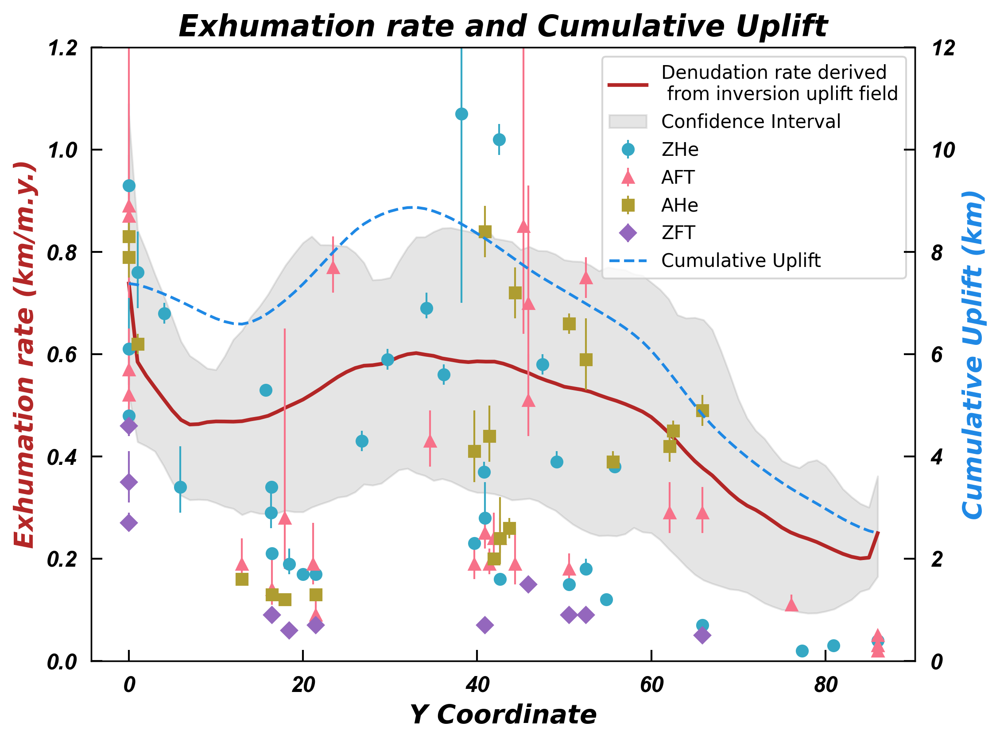

In [4]:
from tkinter import font
import numpy as np
import matplotlib.pyplot as plt
import json
from typing import Dict, List, Any

def load_thermo_data(file_path: str) -> List[Dict[str, Any]]:
    """加载热年代学数据文件"""
    with open(file_path, 'r', encoding='utf-8') as f:
        content = f.read()
        # 提取data =之后的JSON部分
        json_str = content.split('data = ')[1].strip()
        return json.loads(json_str)

def map_distance_to_ycoord(distance: float, y_coords: np.ndarray, 
                          dist_min: float = 30, dist_max: float = 70) -> float:
    """将距离映射到y坐标"""
    return np.interp(distance, [dist_min, dist_max], [len(y_coords)-1, 0])

def plot_uplift_distribution_y(exhumation_data: np.ndarray, uplift_data: np.ndarray, 
                             thermo_data_path: str = None) -> plt.Figure:
    """绘制沿Y轴的剥蚀率分布图和总隆升量，包含热年代学数据点"""
    def calculate_bounds(data, lower_percentile=5, upper_percentile=95):
        """计算数据的上下限"""
        lower_bound = np.percentile(data, lower_percentile, axis=1)
        upper_bound = np.percentile(data, upper_percentile, axis=1)
        return lower_bound, upper_bound
    # 准备基础数据
    y_coords = np.arange(exhumation_data.shape[0])
    exhumation_values = exhumation_data/10  # 转换单位
    mean_exhumation = np.mean(exhumation_values, axis=1)
    std_exhumation = np.std(exhumation_values, axis=1)
    lower_bound, upper_bound = calculate_bounds(exhumation_values)
    mean_uplift = np.mean(uplift_data, axis=1)  # 不再除以10

    # 创建图形
    fig = plt.figure(figsize=(8, 6), dpi=300)
    ax1 = plt.gca()
    
    # 绘制平均值和置信区间
    ax1.plot(y_coords, mean_exhumation, color='#B32626', 
            label='Denudation rate derived \n from inversion uplift field', linewidth=2)
    ax1.fill_between(y_coords, lower_bound, upper_bound,
                    color='gray', alpha=0.2, 
                    label='Confidence Interval')

    # 添加热年代学数据点（如果提供）
    if thermo_data_path:
        thermo_data = load_thermo_data(thermo_data_path)
        
        # 定义不同样品类型的标记和颜色
        markers = {
            'ZHe': ('o', '#35A8C4'),  # 蓝色圆形
            'AFT': ('^', '#F77189'),  # 绿色三角形
            'AHe': ('s', '#AE9D31'),  # 橙色方形
            'ZFT': ('D', '#9467bd')   # 紫色菱形
        }
        
        # 按样品类型分组绘制数据点
        for sample_type, (marker, color) in markers.items():
            type_data = [d for d in thermo_data if d['Sample type'] == sample_type]
            if not type_data:
                continue
                
            distances = [d['Distance along swath (km)'] for d in type_data]
            rates = [d['Exhumation rate (km/m.y.)'] for d in type_data]
            errors_plus = [d['Error+'] for d in type_data]
            errors_minus = [d['Error-'] for d in type_data]
            
            # 映射距离到y坐标
            mapped_x = [map_distance_to_ycoord(d, y_coords) for d in distances]
            
            # 绘制数据点和误差棒
            ax1.errorbar(mapped_x, rates, 
                        yerr=[errors_minus, errors_plus],
                        fmt=marker, color=color, label=sample_type,
                        markersize=6, capsize=5, capthick=0,
                        elinewidth=1, alpha=1)

    # 设置轴标签和标题
    ax1.set_xlabel('Y Coordinate', fontsize=14, weight='bold', fontstyle='italic')
    ax1.set_ylabel('Exhumation rate (km/m.y.)', fontsize=14, weight='bold', 
                   fontstyle='italic', color='#B32626')
    ax1.set_ylim(0, 1.2)
    ax1.set_title('Exhumation rate and Cumulative Uplift', 
                  fontsize=16, weight='bold', fontstyle='italic')
    ax1.tick_params(axis='y', labelcolor='#B32626')
    
    # 添加次坐标轴显示总隆升量
    ax2 = ax1.twinx()
    ax2.plot(y_coords, mean_uplift, color='#1E88E5', 
             linestyle='--', label='Cumulative Uplift')
    ax2.set_ylabel('Cumulative Uplift (km)', fontsize=14, weight='bold', 
                   fontstyle='italic', color='#1E88E5')
    ax2.tick_params(axis='y', labelcolor='#1E88E5')
    ax2.set_ylim(0, 12)
    
    # 合并图例
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, 
              fontsize=10, loc='upper right')

    
    def set_tick_style(ax, fontsize=12, fontfamily='Arial'):
        """设置刻度标注样式"""
        ax.tick_params(
            axis='both',          # 同时设置x轴和y轴
            which='major',        # 主刻度
            labelsize=fontsize,   # 字体大小
            direction='in',       # 刻度线朝内
            length=6,            # 刻度线长度
            width=1,             # 刻度线宽度
            colors='black',      # 刻度颜色
            pad=8               # 刻度标签与轴的距离
        )
        
        # 设置刻度标签字体
        for label in ax.get_xticklabels() + ax.get_yticklabels():
            label.set_fontname(fontfamily)
            label.set_fontweight('bold')
            label.set_fontstyle('italic')

    # 应用到两个子图
    set_tick_style(ax1)
    set_tick_style(ax2)
    # 调整布局
    #plt.tight_layout()
    
    return fig

# 读取数据文件
uplift_data = np.load(r"D:\OneDrive\文档\MATLAB 代码\LMS_Optimization_Experiment\Expt_2025-02-20_17-58-11\best_full_res_uplift.npy")
final_elevation = np.load(r"D:\OneDrive\文档\MATLAB 代码\LMS_Optimization_Experiment\Expt_2025-02-20_17-58-11\final_elevation.npy")
exhumation_data = uplift_data - final_elevation/1000

# 调用函数
fig = plot_uplift_distribution_y(
    exhumation_data,
    uplift_data,
    r"D:\OneDrive\MR.Z  所有资料\Phd Period\论文：Optimized\热年代学数据.txt"
)
plt.show()

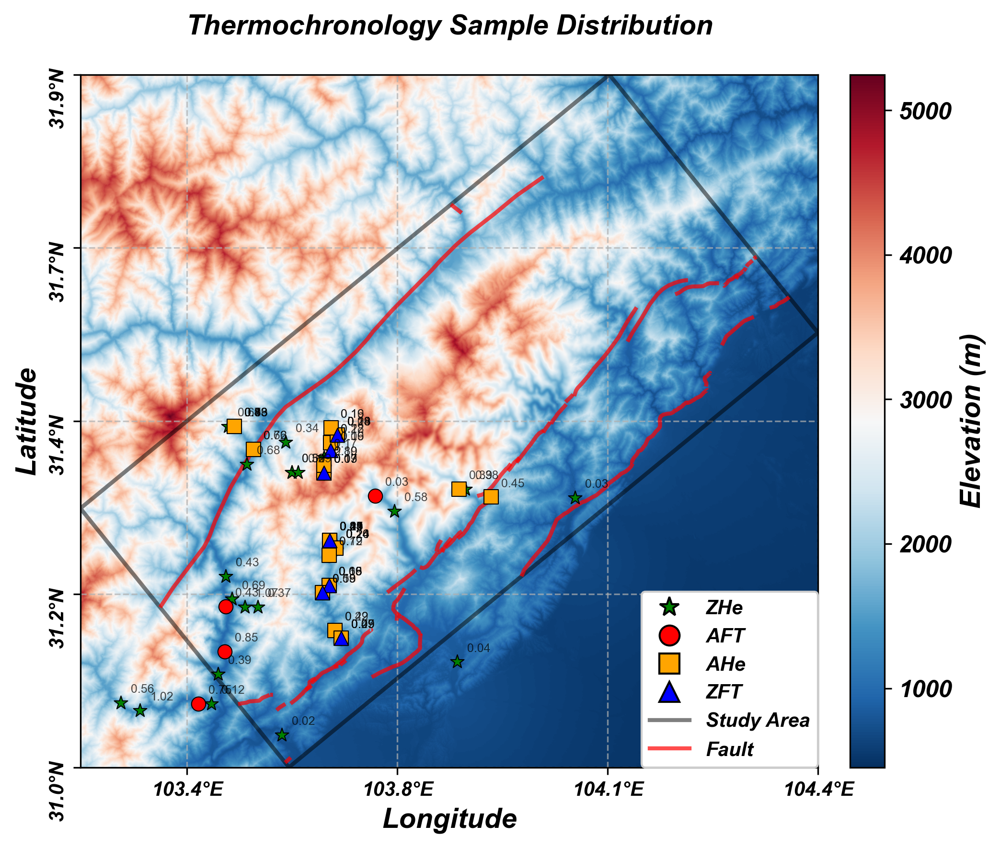

In [25]:
import json
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from pyproj import Transformer
import rasterio
from rasterio.plot import plotting_extent
from rasterio.windows import from_bounds

def load_thermo_data(json_file):
    """加载热年代学数据"""
    with open(json_file, 'r', encoding='utf-8') as f:
        data = json.load(f)
    df = pd.DataFrame(data)
    
    # 创建坐标转换器 (WGS84 to UTM 48N)
    transformer = Transformer.from_crs("EPSG:4326", "EPSG:32648", always_xy=True)
    
    # 转换坐标
    utm_coords = [transformer.transform(row['Long'], row['Lat']) for _, row in df.iterrows()]
    df['X_UTM'] = [coord[0] for coord in utm_coords]
    df['Y_UTM'] = [coord[1] for coord in utm_coords]
    
    return df

def plot_thermo_points_with_dem(shp_file, thermo_data, dem_file, fault_shp_path=None):
    """在DEM底图上绘制热年代学数据点和断层"""
    # 读取地图边界并转换到UTM 48N
    boundary = gpd.read_file(shp_file).to_crs("EPSG:32648")
    bbox = boundary.total_bounds  # [minx, miny, maxx, maxy]

    # 创建图形
    fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

    # 读取和显示DEM数据
    with rasterio.open(dem_file) as src:
        # 使用正确范围裁剪DEM
        window = from_bounds(*bbox, transform=src.transform)
        dem_data = src.read(1, window=window)
        transform = src.window_transform(window)

        # 计算显示范围
        extent = plotting_extent(dem_data, transform)
        
        # 使用 imshow 显示 DEM
        image = ax.imshow(
            dem_data, 
            extent=extent, 
            cmap='RdBu_r', 
            alpha=1
        )
        
        # 添加颜色条并调整位置
        cbar = plt.colorbar(image, ax=ax, label='Elevation (m)', pad=0.03)
        cbar.ax.tick_params(labelsize=10)
        cbar.ax.yaxis.set_tick_params(labelsize=12)
        for label in cbar.ax.get_yticklabels():
            label.set_fontname('Arial')
            label.set_fontstyle('italic')
            label.set_fontweight('bold')
        cbar.set_label('Elevation (m)', fontsize=14, weight='bold', fontstyle='italic', family='Arial')

    # 绘制地图边界
    boundary.boundary.plot(ax=ax, color='black', linewidth=2, alpha=0.5)

    # 如果提供了断层数据，读取并绘制断层
    if fault_shp_path:
        # 读取断层数据并转换投影
        faults = gpd.read_file(fault_shp_path).to_crs("EPSG:32648")
        
        # 使用边界框裁剪断层数据
        faults_clipped = gpd.clip(faults, boundary)
        
        # 绘制断层线
        faults_clipped.geometry.plot(
            ax=ax,
            color='red',
            linewidth=2,
            linestyle='-',
            alpha=0.7,
            zorder=2  # 确保断层线在DEM之上
        )

    # 定义不同样品类型的标记和颜色
    markers = {
        'ZHe': ('*', 'green'),    # 星形
        'AFT': ('o', 'red'),      # 圆形
        'AHe': ('s', 'orange'),   # 方形
        'ZFT': ('^', 'blue')      # 三角形
    }

    # 绘制数据点
    legend_elements = []
    for sample_type, (marker, color) in markers.items():
        data_subset = thermo_data[thermo_data['Sample type'] == sample_type]
        if not data_subset.empty:
            # 绘制散点
            ax.scatter(
                data_subset['X_UTM'], data_subset['Y_UTM'],
                c=color, marker=marker, s=50,
                edgecolor='black', linewidth=0.5, alpha=1,
                zorder=3  # 确保点在断层线之上
            )
            
            # 添加透明标注
            for _, row in data_subset.iterrows():
                ax.annotate(
                    f"{row['Exhumation rate (km/m.y.)']:.2f}",
                    (row['X_UTM'], row['Y_UTM']),
                    xytext=(5, 5), textcoords='offset points',
                    fontsize=6, alpha=0.7,
                    bbox=dict(facecolor='none', edgecolor='none', alpha=0.7),
                    zorder=4  # 确保标注在最上层
                )
            
            legend_elements.append(
                Line2D([0], [0], marker=marker, color='w', markerfacecolor=color, 
                      markeredgecolor='black', markersize=10, label=sample_type)
            )

    # 添加研究区边界和断层图例元素
    legend_elements.append(
        Line2D([0], [0], color='black', lw=2, linestyle='-', 
              alpha=0.5, label='Study Area')
    )
    if fault_shp_path:
        legend_elements.append(
            Line2D([0], [0], color='red', lw=2, linestyle='-',
                  alpha=0.7, label='Fault')
        )

    # 坐标轴设置
    ax.set_xlabel('Longitude', fontsize=14, weight='bold', fontstyle='italic')
    ax.set_ylabel('Latitude', fontsize=14, weight='bold', fontstyle='italic')
    ax.set_title('Thermochronology Sample Distribution', 
                fontsize=14, weight='bold', fontstyle='italic', pad=20)
    
    # 设置科学计数法格式
    ax.ticklabel_format(style='plain', useOffset=False)
    
    # 设置网格样式
    ax.grid(True, linestyle='--', alpha=0.7)

    # 转换坐标轴标签为经纬度
    transformer_to_wgs = Transformer.from_crs("EPSG:32648", "EPSG:4326", always_xy=True)
    
    # 获取当前坐标范围
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    # 生成刻度位置
    xticks = np.linspace(xlim[0], xlim[1], 5)
    yticks = np.linspace(ylim[0], ylim[1], 5)
    
    # 转换刻度标签
    lon_labels, _ = transformer_to_wgs.transform(xticks, [np.mean(ylim)]*5)
    _, lat_labels = transformer_to_wgs.transform([np.mean(xlim)]*5, yticks)
    
    # 设置刻度标签
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{lon:.1f}°E" for lon in lon_labels])
    ax.set_yticks(yticks)
    ax.set_yticklabels([f"{lat:.1f}°N" for lat in lat_labels])
    
    # 逆时针旋转y轴标签
    for label in ax.get_yticklabels():
        label.set_rotation(90)
        
    # 设置坐标轴范围
    ax.set_xlim(extent[0], extent[1])
    ax.set_ylim(extent[2], extent[3])
    
    # 添加图例（避免与颜色条重叠）
    ax.legend(
        handles=legend_elements,
        loc='lower right',
        framealpha=1,
        borderaxespad=0.,
        prop={'family': 'Arial', 'style': 'italic', 'weight': 'bold'}
    )
    
    for label in (ax.get_xticklabels() + ax.get_yticklabels()):
        label.set_fontname('Arial')
        label.set_fontstyle('italic')
        label.set_fontweight('bold')

    plt.tight_layout()
    return fig


# 使用示例
if __name__ == "__main__":
    # 文件路径
    shp_file = r"D:\OneDrive\文档\MATLAB 代码\Para_Optimization_test\DEM_data\LMS_Study_Area.shp"
    json_file = r"D:\OneDrive\MR.Z  所有资料\Phd Period\论文：Optimized\热年代学数据&坐标.json"
    dem_file = r"D:\OneDrive\文档\ArcGIS\COPDEM_MIN_UTM.tif"
    fault_shp_path = r"D:\OneDrive\文档\ArcGIS\全国矢量数据\全国断层.shp"
    
    # 加载数据
    thermo_data = load_thermo_data(json_file)
    
    # 绘制地图
    fig = plot_thermo_points_with_dem(shp_file, thermo_data, dem_file, fault_shp_path)
    plt.show()

原始数据行数: 158
有效坐标数据行数: 158
有效年龄数据行数: 156
年龄范围: 0.25 - 104.30 Ma
计算剥蚀速率后的有效数据行数: 96
剥蚀速率范围: 0.09 - 7.10 mm/year
年龄≤6Ma的数据行数: 49

Processed Data Preview:
    sample     Lat     Long  Age_Ma Method  Exhumation_Rate           Region
0   TWTP-1  24.503  121.601    0.95    ZHe         3.062201  Northern Taiwan
1   TWTP-2  24.493  121.609    0.83    ZHe         3.504929  Northern Taiwan
2   TWTP-4  24.518  121.600    0.99    ZHe         2.938476  Northern Taiwan
3  WHe1129  24.409  121.507    0.73    ZHe         3.985056  Northern Taiwan
4    BDW-2  22.616  120.752    1.36    ZHe         2.139037  Southern Taiwan


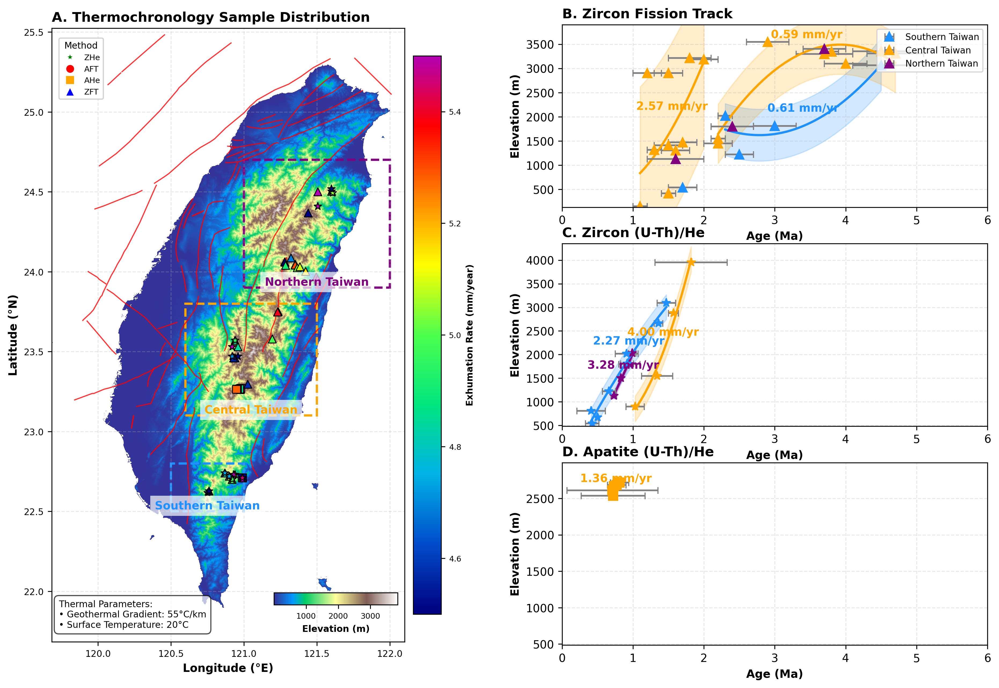

In [3]:
import json
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy import stats
import rasterio
from rasterio.plot import plotting_extent
from rasterio.windows import from_bounds
import logging
from matplotlib.patches import Patch, Rectangle
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def calculate_exhumation_rate(age_ma: float, method: str) -> float:
    """
    计算剥蚀速率
    
    Parameters:
    -----------
    age_ma : float
        样品年龄（Ma）
    method : str
        测年方法（ZFT, AFT, ZHe, AHe等）
        
    Returns:
    --------
    float : 剥蚀速率（mm/year），如果无法计算则返回np.nan
    """
    if age_ma is None or np.isnan(age_ma) or age_ma <= 0 or age_ma > 50:
        return np.nan
    
    closure_temps = {
        'ZFT': 240,  # 锆石裂变径迹
        'AFT': 110,  # 磷灰石裂变径迹
        'ZHe': 180,  # 锆石(U-Th)/He
        'AHe': 70,   # 磷灰石(U-Th)/He
    }
    
    geothermal_gradient = 55
    surface_temp = 20
    
    if method not in closure_temps:
        raise ValueError(f"Unsupported method: {method}")
        
    closure_temp = closure_temps[method]
    exhumation_depth = (closure_temp - surface_temp) / geothermal_gradient * 1000
    
    exhumation_rate = exhumation_depth / age_ma / 1000
    
    return exhumation_rate

def load_thermo_data(json_file: str) -> pd.DataFrame:
    """加载热年代学数据并计算剥蚀速率"""
    try:
        with open(json_file, 'r', encoding='utf-8') as f:
            raw_data = json.load(f)

        df = pd.DataFrame(raw_data).rename(columns={
            'Latitude': 'Lat',
            'Longitude': 'Long',
            'Age(Ma)': 'Age_Ma',
            'elevation (m)': 'Elevation',
            '± 1s': 'Error_1sigma',
            'Sample type': 'Method'
        })

        if 'P: partial reset' in df.columns:
            df['P: partial reset'] = df['P: partial reset'].str.replace(r'[\t　]', '', regex=True)

        numeric_cols = ['Lat', 'Long', 'Elevation', 'Age_Ma', 'Error_1sigma']
        for col in numeric_cols:
            if col in df.columns:
                if df[col].dtype == object:
                    df[col] = df[col].str.strip()
                    df[col] = df[col].replace('', np.nan)
                    df[col] = df[col].replace('-', np.nan)
                df[col] = pd.to_numeric(df[col], errors='coerce')

        print(f"原始数据行数: {len(df)}")
        df = df.dropna(subset=['Lat', 'Long', 'Method'])
        print(f"有效坐标数据行数: {len(df)}")
        
        df = df[df['Age_Ma'] > 0]
        print(f"有效年龄数据行数: {len(df)}")
        
        print(f"年龄范围: {df['Age_Ma'].min():.2f} - {df['Age_Ma'].max():.2f} Ma")

        df['Exhumation_Rate'] = df.apply(
            lambda row: calculate_exhumation_rate(row['Age_Ma'], row['Method']),
            axis=1
        )
        
        df = df[df['Exhumation_Rate'].notna()]
        print(f"计算剥蚀速率后的有效数据行数: {len(df)}")
        
        print(f"剥蚀速率范围: {df['Exhumation_Rate'].min():.2f} - {df['Exhumation_Rate'].max():.2f} mm/year")
        
        # 筛选年龄小于6Ma的数据
        df = df[df['Age_Ma'] <= 5]
        print(f"年龄≤6Ma的数据行数: {len(df)}")
        
        # 区域分类 - 根据截图调整区域范围
        df['Region'] = 'Central Taiwan'
        
        north_mask = df['Lat'] > 24.3
        df.loc[north_mask, 'Region'] = 'Northern Taiwan'
        
        south_mask = df['Lat'] < 22.8
        df.loc[south_mask, 'Region'] = 'Southern Taiwan'
        
        if 'Elevation' not in df.columns or df['Elevation'].isna().all():
            df['Elevation'] = 1000
            
        df['Exhumation_Rate_mmyr'] = df['Exhumation_Rate']

        return df

    except Exception as e:
        logging.error(f"Error loading thermochronology data: {e}")
        raise
        
def create_custom_colormap():
    """创建自定义颜色映射"""
    colors = [(0, 0, 0.5),
              (0, 0.3, 0.8),
              (0, 0.7, 0.9),
              (0, 0.9, 0.5),
              (0.3, 1, 0.3),
              (1, 1, 0),
              (1, 0.5, 0),
              (1, 0, 0),
              (0.7, 0, 0.7)]
    
    return LinearSegmentedColormap.from_list('custom_cmap', colors)

def plot_spatial_distribution(ax, thermo_df, shapefile, dem_file, fault_file=None):
    """绘制空间分布图，并添加区域框"""
    custom_cmap = create_custom_colormap()
    
    boundary = gpd.read_file(shapefile).to_crs("EPSG:4326")

    with rasterio.open(dem_file) as src:
        window = from_bounds(*boundary.total_bounds, transform=src.transform)
        dem = src.read(1, window=window)
        transform = src.window_transform(window)
        extent = plotting_extent(dem, transform)

        dem = np.where(dem <= 0, np.nan, dem)
        dem_plot = ax.imshow(
            dem, extent=extent,
            cmap='terrain', alpha=1,
            vmin=np.nanpercentile(dem, 5),
            vmax=np.nanpercentile(dem, 100)
        )
    # 在图框内放置水平colorbar
    cax_dem = ax.inset_axes([
        0.63,   # 距离左边缘的位置(比例)
        0.06,   # 距离底边缘的位置(比例)
        0.35,   # 宽度(比例)
        0.02    # 高度(比例)
    ])

    # 创建colorbar
    cbar_dem = plt.colorbar(
        dem_plot, 
        cax=cax_dem,
        orientation='horizontal'
    )

    # 设置colorbar样式
    cbar_dem.set_label('Elevation (m)', fontsize=8, weight='bold')
    cbar_dem.ax.tick_params(labelsize=7)

    if fault_file:
        try:
            faults = gpd.read_file(fault_file).to_crs("EPSG:4326")
            try:
                faults_within = gpd.overlay(faults, boundary, how='intersection')
                faults_within.plot(ax=ax, color='red', linewidth=1.0, linestyle='-', alpha=0.8, zorder=5)
            except:
                faults.plot(ax=ax, color='red', linewidth=1.0, linestyle='-', alpha=0.8, zorder=5,label='Fault')
        except Exception as e:
            print(f"Warning: Could not plot faults - {e}")

    # 增加断层线的legend
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, labels, loc='upper left', fontsize=8, framealpha=0.7)
    
    # 添加地温梯度和地表温度注释
    geothermal_info = (
        "Thermal Parameters:\n"
        "• Geothermal Gradient: 55°C/km\n"
        "• Surface Temperature: 20°C"
    )
    
    # 在图的右下角添加注释
    ax.text(
        0.02, 0.02,  # 位置(左下)
        geothermal_info,
        transform=ax.transAxes,  # 使用轴坐标系
        fontsize=8,
        bbox=dict(facecolor='white', alpha=0.7, boxstyle='round,pad=0.5'),
        ha='left', va='bottom'
    )


    # 新的标记样式和颜色映射
    markers = {
        'ZHe': ('*', 'green'),    # 星形, 绿色
        'AFT': ('o', 'red'),      # 圆形, 红色
        'AHe': ('s', 'orange'),   # 方形, 橙色
        'ZFT': ('^', 'blue')      # 三角形, 蓝色
    }
    
    region_colors = {
        'Northern Taiwan': '#800080',
        'Central Taiwan': '#FFA500',
        'Southern Taiwan': '#1E90FF'
    }
    
    # 手动定义区域框范围，确保覆盖相应区域的点
    region_bounds = {
        'Northern Taiwan': (121.0, 23.9, 122, 24.7),  # (min_lon, min_lat, max_lon, max_lat)
        'Central Taiwan': (120.6, 23.1, 121.5, 23.8),
        'Southern Taiwan': (120.5, 22.5, 121.0, 22.8)
    }
    
    # 绘制点
    for region, region_df in thermo_df.groupby('Region'):
        if len(region_df) < 1:
            continue
            
        for method, method_df in region_df.groupby('Method'):
            marker_shape, marker_color = markers.get(method, ('o', 'gray'))
            
            ax.scatter(
                method_df['Long'], method_df['Lat'],
                c=method_df['Exhumation_Rate'],
                cmap=custom_cmap,
                marker=marker_shape,
                s=50, 
                edgecolor='black', 
                linewidth=0.8,
                alpha=1,
                zorder=11
            )
    
    # 绘制区域框
    for region, (min_lon, min_lat, max_lon, max_lat) in region_bounds.items():
        color = region_colors.get(region, 'gray')
        width = max_lon - min_lon
        height = max_lat - min_lat
        
        rect = Rectangle((min_lon, min_lat), width, height,
                         edgecolor=color, facecolor='none',
                         linewidth=2, linestyle='--',
                         label=f"{region} Region")
        ax.add_patch(rect)
        
        # 将区域标题移至框顶部
        ax.text(min_lon + width/2, min_lat,
                region,
                color=color,
                fontsize=10,
                fontweight='bold',
                ha='center',
                va='bottom',  # 改为底部对齐，使文本位于框的顶部
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'),
                zorder=12)
    
    scatter = ax.scatter(
        [-999], [-999],
        c=[5],
        cmap=custom_cmap,
        s=100,
        edgecolor='black',
        linewidth=0.8,
        alpha=1.0,
        zorder=10
    )
    
    cbar_exhu = plt.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02, aspect=20, shrink=0.9)
    cbar_exhu.set_label('Exhumation Rate (mm/year)', fontsize=8, weight='bold')
    cbar_exhu.ax.tick_params(labelsize=7)

    ax.set_xlabel('Longitude (°E)', fontsize=10, weight='bold')
    ax.set_ylabel('Latitude (°N)', fontsize=10, weight='bold')
    ax.set_title('A. Thermochronology Sample Distribution',
                 fontsize=12, weight='bold', loc='left')

    ax.tick_params(axis='both', which='major', labelsize=8)

    ax.set_xlim(boundary.total_bounds[0], boundary.total_bounds[2])
    ax.set_ylim(boundary.total_bounds[1], boundary.total_bounds[3])

    ax.grid(True, linestyle='--', alpha=0.3)
    
    # 使用新的标记样式创建图例
    method_handles = []
    for method, (marker_shape, marker_color) in markers.items():
        method_handles.append(
            plt.Line2D([0], [0], marker=marker_shape, color='w', 
                       markerfacecolor=marker_color, markersize=8, 
                       label=method)
        )
    
    legend1 = ax.legend(handles=method_handles, 
                        loc='upper left',
                        title="Method", 
                        fontsize=7,
                        title_fontsize=8,
                        frameon=True,
                        bbox_to_anchor=(0.01, 0.99))
    
    ax.add_artist(legend1)

def fit_exhumation_rate(df, method, region=None):
    """
    使用多项式拟合计算剥蚀速率，并提供置信区间
    
    Parameters:
    -----------
    df : DataFrame
        包含Age_Ma和Elevation数据的DataFrame
    method : str
        测年方法
    region : str, optional
        区域名称
        
    Returns:
    --------
    dict : 包含拟合结果的字典，如果拟合失败则返回None
    """
    # 筛选数据
    mask = df['Method'] == method
    if region:
        mask &= df['Region'] == region
    
    filtered_df = df[mask]
    
    # 分为两个时间段
    segment1 = filtered_df[(filtered_df['Age_Ma'] <= 6) & (filtered_df['Age_Ma'] > 2)]
    segment2 = filtered_df[(filtered_df['Age_Ma'] <= 2) & (filtered_df['Age_Ma'] > 0)]
    
    results = {'segment1': None, 'segment2': None}
    
    # 函数用于拟合每个段落
    def fit_segment(segment_data):
        if len(segment_data) < 3:
            return None
            
        try:
            # 转换单位：Ma -> yr, m -> mm 用于更精确的计算
            x = segment_data['Age_Ma'].values * 1e6  # Ma -> yr
            y = segment_data['Elevation'].values * 1e3  # m -> mm
            
            # 确定多项式次数
            n_points = len(segment_data)
            degree = min(2, n_points - 2)  # 最高2次多项式
            
            # 多项式拟合
            coeffs = np.polyfit(x, y, degree)
            poly = np.poly1d(coeffs)
            
            # 生成拟合曲线点（用原始单位绘图）
            x_orig = segment_data['Age_Ma'].values
            x_fit = np.linspace(x_orig.min(), x_orig.max(), 100)
            x_fit_yr = x_fit * 1e6  # 转为年用于计算
            y_fit_mm = poly(x_fit_yr)
            y_fit = y_fit_mm / 1e3  # 转回m用于绘图
            
            # 计算置信区间
            y_pred_mm = poly(x)
            residuals = y - y_pred_mm
            se = np.sqrt(np.mean(residuals**2))
            conf_interval = 1.96 * se / 1e3  # 转回m用于绘图
            
            # 计算多项式导数（变化率）
            poly_deriv = np.polyder(poly)
            
            # 计算平均斜率
            slopes_mm_yr = [poly_deriv(t) for t in x_fit_yr]  # mm/yr
            avg_slope_mm_yr = np.mean(slopes_mm_yr)
            
            # 剥蚀速率 = -斜率 (确保为正值)
            # 斜率单位: mm/yr
            exhumation_rate = abs(-avg_slope_mm_yr)
            
            return {
                'x_fit': x_fit,
                'y_fit': y_fit,
                'conf_interval': conf_interval,
                'exhumation_rate': exhumation_rate,
                'data': segment_data
            }
            
        except Exception as e:
            print(f"Error fitting segment for {method} in {region}: {e}")
            return None
    
    # 拟合第一段 (6-2Ma)
    results['segment1'] = fit_segment(segment1)
    
    # 拟合第二段 (2-0Ma)
    results['segment2'] = fit_segment(segment2)
    
    return results

def plot_age_elevation(ax, df, method, panel_index):
    """绘制年龄-海拔关系图，使用多项式拟合和置信区间"""
    method_df = df[df['Method'] == method]
    
    if method_df.empty:
        ax.text(0.5, 0.5, f'No data for {method}', 
                ha='center', va='center', fontsize=12, transform=ax.transAxes)
        return
    
    regions = method_df['Region'].unique()
    
    # 使用新的标记和颜色映射
    markers = {
        'ZHe': ('*', 'green'),    # 星形, 绿色
        'AFT': ('o', 'red'),      # 圆形, 红色
        'AHe': ('s', 'orange'),   # 方形, 橙色
        'ZFT': ('^', 'blue')      # 三角形, 蓝色
    }
    
    region_colors = {
        'Northern Taiwan': '#800080',
        'Central Taiwan': '#FFA500',
        'Southern Taiwan': '#1E90FF'
    }
    
    for region in regions:
        region_df = method_df[method_df['Region'] == region]
        if len(region_df) < 2:
            continue
            
        marker_shape, marker_color = markers.get(method, ('o', 'gray'))
        color = region_colors.get(region, 'gray')
        
        # 绘制散点图
        ax.errorbar(
            region_df['Age_Ma'], 
            region_df['Elevation'],
            xerr=region_df.get('Error_1sigma', None),
            fmt=marker_shape, 
            color=color,
            markersize=8,
            ecolor='gray',
            capsize=3,
            alpha=1,
            label=region
        )
        
        # 多项式拟合和置信区间
        fit_results = fit_exhumation_rate(df, method, region)
        
        # 绘制第一段拟合线（6-2Ma）
        if fit_results and fit_results['segment1']:
            seg1 = fit_results['segment1']
            x_fit = seg1['x_fit']
            y_fit = seg1['y_fit']
            conf = seg1['conf_interval']
            
            # 绘制拟合曲线
            ax.plot(x_fit, y_fit, '-', color=color, linewidth=2)
            
            # 绘制置信区间
            ax.fill_between(x_fit, y_fit - conf, y_fit + conf, 
                           color=color, alpha=0.2)
            
            # 添加剥蚀速率标注
            exh_rate = seg1['exhumation_rate']
            rate_text = f"{exh_rate:.2f} mm/yr"
            
            # 放置在曲线中间位置
            text_x = np.median(x_fit)
            text_y = np.median(y_fit)
            
            # 调整文本位置
            text_offset = (region_df['Elevation'].max() - region_df['Elevation'].min()) * 0.1
            
            ax.text(
                text_x, text_y + text_offset,
                rate_text,
                color=color,
                fontsize=10,
                fontweight='bold',
                ha='center',
                va='bottom'
            )
        
        # 绘制第二段拟合线（2-0Ma）
        if fit_results and fit_results['segment2']:
            seg2 = fit_results['segment2']
            x_fit = seg2['x_fit']
            y_fit = seg2['y_fit']
            conf = seg2['conf_interval']
            
            # 绘制拟合曲线
            ax.plot(x_fit, y_fit, '-', color=color, linewidth=2)
            
            # 绘制置信区间
            ax.fill_between(x_fit, y_fit - conf, y_fit + conf, 
                           color=color, alpha=0.2)
            
            # 添加剥蚀速率标注
            exh_rate = seg2['exhumation_rate']
            rate_text = f"{exh_rate:.2f} mm/yr"
            
            # 放置在曲线中间位置
            text_x = np.median(x_fit)
            text_y = np.median(y_fit)
            
            # 调整文本位置
            text_offset = (region_df['Elevation'].max() - region_df['Elevation'].min()) * 0.1
            
            ax.text(
                text_x, text_y + text_offset,
                rate_text,
                color=color,
                fontsize=10,
                fontweight='bold',
                ha='center',
                va='bottom'
            )
    
    method_titles = {
        'ZFT': 'B. Zircon Fission Track',
        'ZHe': 'C. Zircon (U-Th)/He',
        'AHe': 'D. Apatite (U-Th)/He'
    }
    
    ax.set_title(method_titles.get(method, f"{method}"), fontsize=12, weight='bold', loc='left')
    ax.set_xlabel('Age (Ma)', fontsize=10, weight='bold')
    ax.set_ylabel('Elevation (m)', fontsize=10, weight='bold')
    
    ax.set_xlim(0, 6)
    
    if not method_df.empty:
        y_min = method_df['Elevation'].min() * 0.9
        y_max = method_df['Elevation'].max() * 1.1
        ax.set_ylim(y_min, y_max)
    
    ax.grid(True, linestyle='--', alpha=0.3)
    
    if panel_index == 0:
        ax.legend(loc='upper right', fontsize=8)

def create_enhanced_visualization(thermo_df, shapefile, dem_file, fault_file=None):
    """创建增强的多面板可视化"""
    fig = plt.figure(figsize=(15, 10), dpi=300)
    
    gs = GridSpec(3, 2, figure=fig, height_ratios=[1, 1, 1])
    
    ax_map = fig.add_subplot(gs[:, 0])
    plot_spatial_distribution(ax_map, thermo_df, shapefile, dem_file, fault_file)
    
    methods = ['ZFT', 'ZHe', 'AHe']
    
    for i, method in enumerate(methods):
        method_df = thermo_df[thermo_df['Method'] == method]
        if not method_df.empty:
            ax_method = fig.add_subplot(gs[i, 1])
            plot_age_elevation(ax_method, thermo_df, method, i)
    
    return fig

if __name__ == "__main__":
    json_file = r"D:\OneDrive\MR.Z  所有资料\Phd Period\论文：Optimized\台湾热年代学数据.json"
    shapefile = r'D:\OneDrive\文档\MATLAB 代码\Para_Optimization_test\DEM_data\Taiwan.shp'
    dem_file = r'D:\OneDrive\文档\MATLAB 代码\Para_Optimization_test\DEM_data\Taiwan_DEM_WGS84_30m.tif'
    fault_file = r'D:\OneDrive\文档\ArcGIS\全国矢量数据\全国断层.shp'

    try:
        thermo_df = load_thermo_data(json_file)

        print("\nProcessed Data Preview:")
        preview_cols = ['sample', 'Lat', 'Long', 'Age_Ma', 'Method', 'Exhumation_Rate', 'Region']
        print(thermo_df[preview_cols].head())

        fig = create_enhanced_visualization(thermo_df, shapefile, dem_file, fault_file)
        
        plt.savefig('taiwan_thermochronology_enhanced.png', dpi=300, bbox_inches='tight')
        plt.savefig('taiwan_thermochronology_enhanced.pdf', bbox_inches='tight')
        
        plt.show()

    except Exception as e:
        print(f"程序运行出错: {str(e)}")
        import traceback
        traceback.print_exc()

Balanced visualization saved to D:\OneDrive\文档\MATLAB 代码\LMS_Optimization_Experiment\Expt_2025-02-20_19-30-05


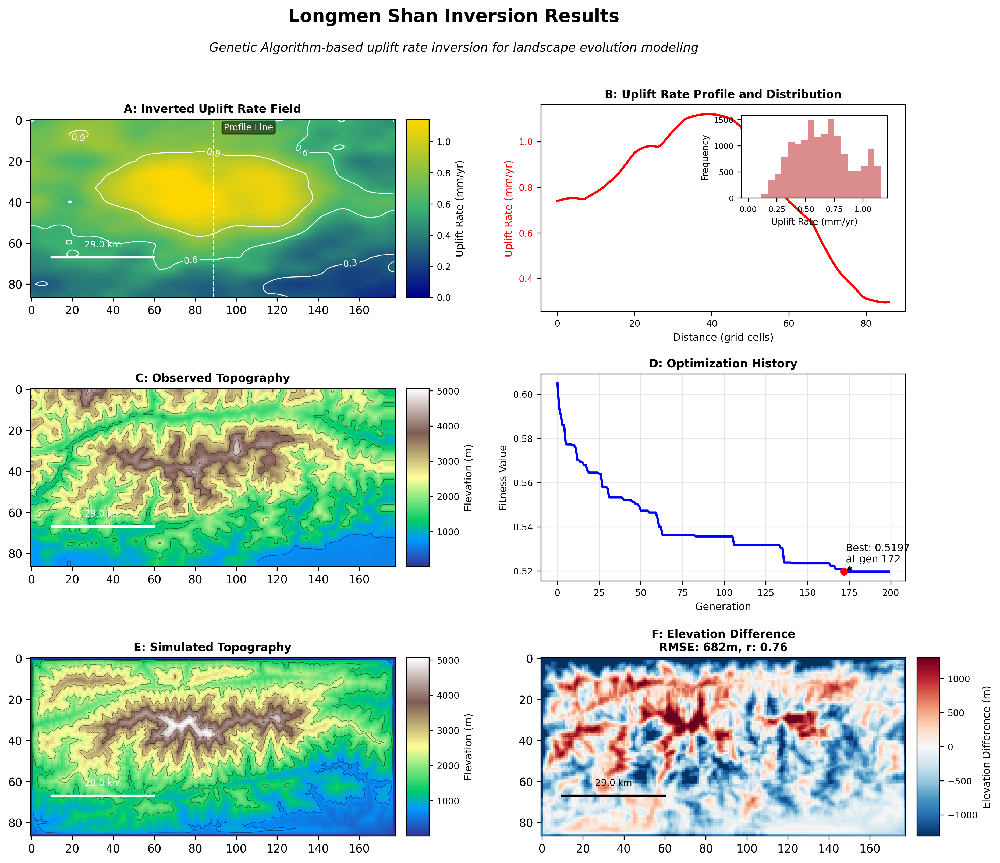

In [4]:
from result_visualizer import create_comprehensive_visualization
import numpy as np
import os
from IPython.display import Image, display

# Define the folder path
folder_path = r"D:\OneDrive\文档\MATLAB 代码\LMS_Optimization_Experiment\Expt_2025-02-20_19-30-05"

# Load the required data
best_full_res_uplift = np.load(os.path.join(folder_path, "best_full_res_uplift.npy"))
final_elevation = np.load(os.path.join(folder_path, "final_elevation.npy"))
resampled_dem = np.load(os.path.join(folder_path, "rotated_dem_data.npy"))
fitness_history = np.load(os.path.join(folder_path, "fitness_history.npy"))
output_path = folder_path

vis_path = create_comprehensive_visualization(
    best_full_res_uplift=best_full_res_uplift/10,
    final_elevation=final_elevation,
    target_dem=resampled_dem,
    fitness_history=fitness_history,
    output_path=output_path,
    resolution= 579
)
# Display the visualization
display(Image(filename=vis_path))

Natural Earth 数据信息: 宽度=21600, 高度=10800, 波段数=3
坐标系: EPSG:4326
Natural Earth I 数据加载成功
台湾SHP原始坐标系: EPSG:4326
龙门山SHP原始坐标系: EPSG:32648
地图已保存至: location_map_geographic.png


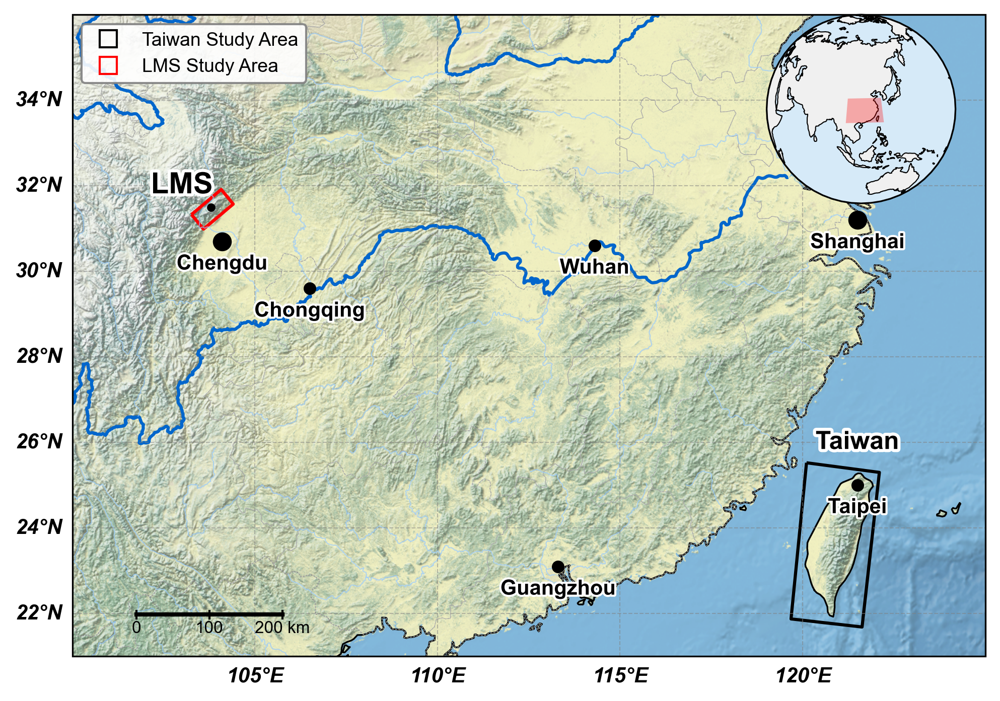

In [35]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
import geopandas as gpd
import numpy as np
import matplotlib.patheffects as PathEffects
from matplotlib.patches import FancyArrowPatch, Rectangle
import os
import warnings
import rasterio
from rasterio.plot import show
from rasterio.warp import calculate_default_transform, reproject, Resampling
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches

warnings.filterwarnings('ignore')  # 抑制不必要的警告

def create_research_map(
    taiwan_shp_path='D:\\OneDrive\\文档\\MATLAB 代码\\Para_Optimization_test\\DEM_data\\Taiwan.shp',
    lms_shp_path='D:\\OneDrive\\文档\\MATLAB 代码\\Para_Optimization_test\\DEM_data\\LMS_Study_Area.shp',
    natural_earth_path='C:\\Users\\Administrator\\Documents\\ArcGIS\\NE1_LR_LC_SR_W_DR.tif',
    output_path='location_map.png',
    figsize=(8, 5),
    dpi=300
):
    """
    创建研究区位置图，包含台湾和龙门山地区，使用Natural Earth I数据集作为底图
    使用地理坐标系(PlateCarree)来保持经纬度比例
    """
    # 设置字体
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 10
    
    # 设置地图范围（东经100°-125°，北纬20°-35°）
    extent = [100, 125, 21, 36]
    
    # 创建图形
    fig = plt.figure(figsize=figsize, dpi=dpi)
    
    # 使用PlateCarree投影（等经纬度投影）来保持经纬度格网的直线性质
    # 这样地图会以地理坐标的形式显示，经纬度线是直线
    main_ax = plt.axes([0.05, 0.05, 0.9, 0.85], projection=ccrs.PlateCarree())
    
    # 重要：设置地图纵横比例为1，确保经纬度比例正确
    main_ax.set_aspect('equal')
    
    # 设置地图范围
    main_ax.set_extent(extent, crs=ccrs.PlateCarree())
    
    # 加载 Natural Earth I 数据
    try:
        with rasterio.open(natural_earth_path) as src:
            print(f"Natural Earth 数据信息: 宽度={src.width}, 高度={src.height}, 波段数={src.count}")
            print(f"坐标系: {src.crs}")
            
            # 读取数据并显示
            ne_data = src.read()
            
            # 如果是RGB格式，我们需要转置并归一化数据
            if src.count == 3:
                # 转置数据为 (height, width, channels) 格式
                rgb_data = np.transpose(ne_data, (1, 2, 0))
                
                # 归一化数据 (通常Natural Earth的值范围是0-255)
                if rgb_data.max() > 1:
                    rgb_data = rgb_data / 255.0
                
                # 直接显示
                main_ax.imshow(
                    rgb_data, 
                    origin='upper', 
                    extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                    transform=ccrs.PlateCarree(),
                    interpolation='bilinear'
                )
            else:
                # 如果不是RGB格式，使用rasterio的show函数
                show(
                    src, 
                    ax=main_ax, 
                    transform=ccrs.PlateCarree(),
                    cmap='terrain'
                )
            
            print("Natural Earth I 数据加载成功")
    except Exception as e:
        print(f"Natural Earth I 数据加载失败: {e}")
        # 如果加载失败，使用基础底图
        main_ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#f8f8f8', edgecolor='none')
        main_ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='#d6eaf8', edgecolor='none')
    
    # 添加海岸线 - 清晰的黑色轮廓
    main_ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.8, edgecolor='black')
    
    # 添加国界线 - 灰色虚线
    main_ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidth=0.5, edgecolor='gray', linestyle=':')
    
    # 添加省界线 - 较浅的灰色虚线
    try:
        main_ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.3, edgecolor='#aaaaaa', linestyle='--')
    except:
        print("省界线数据加载失败，继续处理...")
    
    # 下载并加载河流数据 - 保留原始代码的河流处理方式
    rivers_path = 'ne_10m_rivers_lake_centerlines.shp'
    rivers_dir = 'rivers_data'
    rivers_full_path = os.path.join(rivers_dir, rivers_path)
    
    if not os.path.exists(rivers_full_path):
        try:
            import requests
            import zipfile
            import io
            
            if not os.path.exists(rivers_dir):
                os.makedirs(rivers_dir)
                
            print("下载河流数据...")
            river_url = 'https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_rivers_lake_centerlines.zip'
            response = requests.get(river_url)
            z = zipfile.ZipFile(io.BytesIO(response.content))
            z.extractall(rivers_dir)
            print("河流数据下载完成")
        except Exception as e:
            print(f"河流数据下载失败: {e}")
            rivers_feature = cfeature.NaturalEarthFeature(
                category='physical',
                name='rivers_lake_centerlines',
                scale='10m',
                facecolor='none',
                edgecolor='blue'
            )
            main_ax.add_feature(rivers_feature, linewidth=0.7)
            print("已使用Cartopy内置河流数据")
    
    if os.path.exists(rivers_full_path):
        try:
            rivers_gdf = gpd.read_file(rivers_full_path)
            major_rivers = rivers_gdf[(rivers_gdf['name'].str.contains('Yangtze|Chang|长江', case=False, na=False)) | 
                                     (rivers_gdf['name'].str.contains('Yellow|Huang|黄河', case=False, na=False)) |
                                     (rivers_gdf['scalerank'] == 1)]
            minor_rivers = rivers_gdf[~rivers_gdf.index.isin(major_rivers.index)]
            
            if not major_rivers.empty:
                major_rivers.plot(ax=main_ax, color='#0066CC', linewidth=1.5, transform=ccrs.PlateCarree())
            if not minor_rivers.empty:
                minor_rivers.plot(ax=main_ax, color='#99CCFF', linewidth=0.5, transform=ccrs.PlateCarree(), alpha=0.7)
        except Exception as e:
            print(f"河流数据加载失败: {e}")
    
    # 加载并绘制研究区（台湾和龙门山）
    try:
        # 台湾研究区 - 仅黑色边框
        taiwan_gdf = gpd.read_file(taiwan_shp_path)
        print(f"台湾SHP原始坐标系: {taiwan_gdf.crs}")
        if taiwan_gdf.crs is None or taiwan_gdf.crs.to_string() != 'EPSG:4326':
            taiwan_gdf = taiwan_gdf.to_crs('EPSG:4326')
        taiwan_gdf.plot(
            ax=main_ax,
            facecolor='none',  # 不填充颜色
            edgecolor='black',
            linewidth=1.5,
            transform=ccrs.PlateCarree()
        )
        if not taiwan_gdf.empty:
            # 使用 Taiwan 而不是台湾中心点来标注
            ax_text = main_ax.text(
                121.5, 26.0,  # 使用台北的坐标作为标注位置
                'Taiwan',
                fontsize=12,
                weight='bold',
                ha='center',
                va='center',
                transform=ccrs.PlateCarree(),
                color='black'
            )
            ax_text.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='white')])
    except Exception as e:
        print(f"台湾研究区加载失败: {e}")
    
    try:
        # 龙门山研究区 - 仅红色边框
        lms_gdf = gpd.read_file(lms_shp_path)
        print(f"龙门山SHP原始坐标系: {lms_gdf.crs}")
        if lms_gdf.crs is None or lms_gdf.crs.to_string() != 'EPSG:4326':
            lms_gdf = lms_gdf.to_crs('EPSG:4326')
        lms_gdf.plot(
            ax=main_ax,
            facecolor='none',  # 不填充颜色
            edgecolor='red',
            linewidth=1.5,
            transform=ccrs.PlateCarree()
        )
        if not lms_gdf.empty:
            # LMS标签
            lms_label_x = 103.0  # 靠近龙门山的位置
            lms_label_y = 32.0   # 龙门山上方
            
            lms_text = main_ax.text(
                lms_label_x, lms_label_y,
                'LMS',
                fontsize=14,
                weight='bold',
                ha='center',
                va='center',
                transform=ccrs.PlateCarree(),
                color='black'
            )
            lms_text.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='white')])
    except Exception as e:
        print(f"龙门山研究区加载失败: {e}")
    
    # 添加主要城市
    major_cities = [
        (121.5, 25.0, 'Taipei', 'medium'),    # 台北
        (104.1, 30.7, 'Chengdu', 'large'),    # 成都
        (103.8, 31.5, 'Wenchuan', 'small'),   # 汶川
        (116.4, 39.9, 'Beijing', 'large'),    # 北京
        (121.5, 31.2, 'Shanghai', 'large'),   # 上海
        (114.3, 30.6, 'Wuhan', 'medium'),     # 武汉
        (113.3, 23.1, 'Guangzhou', 'medium'), # 广州
        (106.5, 29.6, 'Chongqing', 'medium'), # 重庆
    ]
    
    cities_in_extent = [
        (lon, lat, name, size) for lon, lat, name, size in major_cities
        if extent[0] <= lon <= extent[1] and extent[2] <= lat <= extent[3]
    ]
    
    for lon, lat, name, size in cities_in_extent:
        marker_size = 8 if size == 'large' else 5 if size == 'medium' else 3
        main_ax.plot(lon, lat, 'o', color='black', markersize=marker_size, transform=ccrs.PlateCarree(), zorder=10)
        if size in ['large', 'medium']:
            city_text = main_ax.text(
                lon, lat - 0.3, name, fontsize=10, ha='center', va='top',
                transform=ccrs.PlateCarree(), fontweight='bold'
            )
            city_text.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='white')])
    
    # 添加等间隔的经纬度网格线
    gl = main_ax.gridlines(
        crs=ccrs.PlateCarree(), 
        draw_labels=True, 
        linewidth=0.5,
        color='gray', 
        alpha=0.5, 
        linestyle='--',
        x_inline=False, 
        y_inline=False
    )
    
    # 设置网格线间隔为5度
    gl.xlocator = plt.MultipleLocator(5)
    gl.ylocator = plt.MultipleLocator(2)
    
    # 只在底部和左侧绘制标签
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 10}
    gl.ylabel_style = {'size': 10}
    

    
    # 添加比例尺 - 使用Cartopy适配的方法
    from matplotlib.transforms import ScaledTranslation
    from matplotlib.font_manager import FontProperties
    
    # 创建比例尺坐标轴
    scale_box = main_ax.inset_axes([0.05, 0.05, 0.2, 0.03], transform=main_ax.transAxes)
    scale_box.set_xlim(0, 1)
    scale_box.set_ylim(0, 1)
    scale_box.set_axis_off()
    scale_box.set_aspect('auto')
    
    # 添加比例尺线
    scale_box.plot([0.1, 0.9], [0.5, 0.5], 'k-', linewidth=2)
    
    # 添加刻度
    scale_box.plot([0.1, 0.1], [0.3, 0.7], 'k-', linewidth=1)
    scale_box.plot([0.5, 0.5], [0.3, 0.7], 'k-', linewidth=1)
    scale_box.plot([0.9, 0.9], [0.3, 0.7], 'k-', linewidth=1)
    
    # 添加标签
    scale_box.text(0.1, 0.2, '0', ha='center', va='top', fontsize=8)
    scale_box.text(0.5, 0.2, '100', ha='center', va='top', fontsize=8)
    scale_box.text(0.9, 0.2, '200 km', ha='center', va='top', fontsize=8)
    
    # 添加全球视图的小地图 (Orthographic projection)
    # 创建正交投影的小地图
    inset_ax = plt.axes([0.65, 0.65, 0.25, 0.25], projection=ccrs.Orthographic(central_longitude=110, central_latitude=30))
    inset_ax.set_global()
    
    # 添加全球特征
    inset_ax.add_feature(cfeature.LAND, facecolor='#f0f0f0')
    inset_ax.add_feature(cfeature.OCEAN, facecolor='#d6eaf8')
    inset_ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='black')
    
    # 高亮显示主图显示区域
    highlight_poly = Rectangle(
        (extent[0], extent[2]), 
        extent[1]-extent[0], 
        extent[3]-extent[2],
        facecolor='red', 
        alpha=0.3, 
        transform=ccrs.PlateCarree(),
        zorder=10
    )
    inset_ax.add_patch(highlight_poly)
    
    # 添加图例
    legend_elements = [
        Line2D([0], [0], color='black', marker='s', markersize=8, markerfacecolor='none',
               markeredgecolor='black', lw=0, label='Taiwan Study Area'),
        Line2D([0], [0], color='red', marker='s', markersize=8, markerfacecolor='none',
               markeredgecolor='red', lw=0, label='LMS Study Area')
    ]

    main_ax.legend(
        handles=legend_elements, 
        loc='upper left', 
        frameon=True,
        facecolor='white', 
        edgecolor='gray', 
        framealpha=0.9, 
        fontsize=9
    )
    #设置坐标轴标签格式
    main_ax.set_xlabel('Longitude (°E)', fontsize=10, weight='bold')
    main_ax.set_ylabel('Latitude (°N)', fontsize=10, weight='bold')
    gl.xlabel_style = {'size': 10, 'weight': 'bold', 'style': 'italic', 'fontname': 'Arial'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold', 'style': 'italic', 'fontname': 'Arial'}

    
    # 调整图形布局以适应投影比例
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    print(f"地图已保存至: {output_path}")
    
    # 显示图像
    plt.show()
    
    return output_path

if __name__ == "__main__":
    create_research_map(
        taiwan_shp_path='D:\\OneDrive\\文档\\MATLAB 代码\\Para_Optimization_test\\DEM_data\\Taiwan.shp',
        lms_shp_path='D:\\OneDrive\\文档\\MATLAB 代码\\Para_Optimization_test\\DEM_data\\LMS_Study_Area.shp',
        natural_earth_path=r"C:\Users\Administrator\Documents\ArcGIS\NE1_HR_LC_SR_W.tif",
        output_path='location_map_geographic.png'
    )

地图已保存至: taiwan_location_map.png


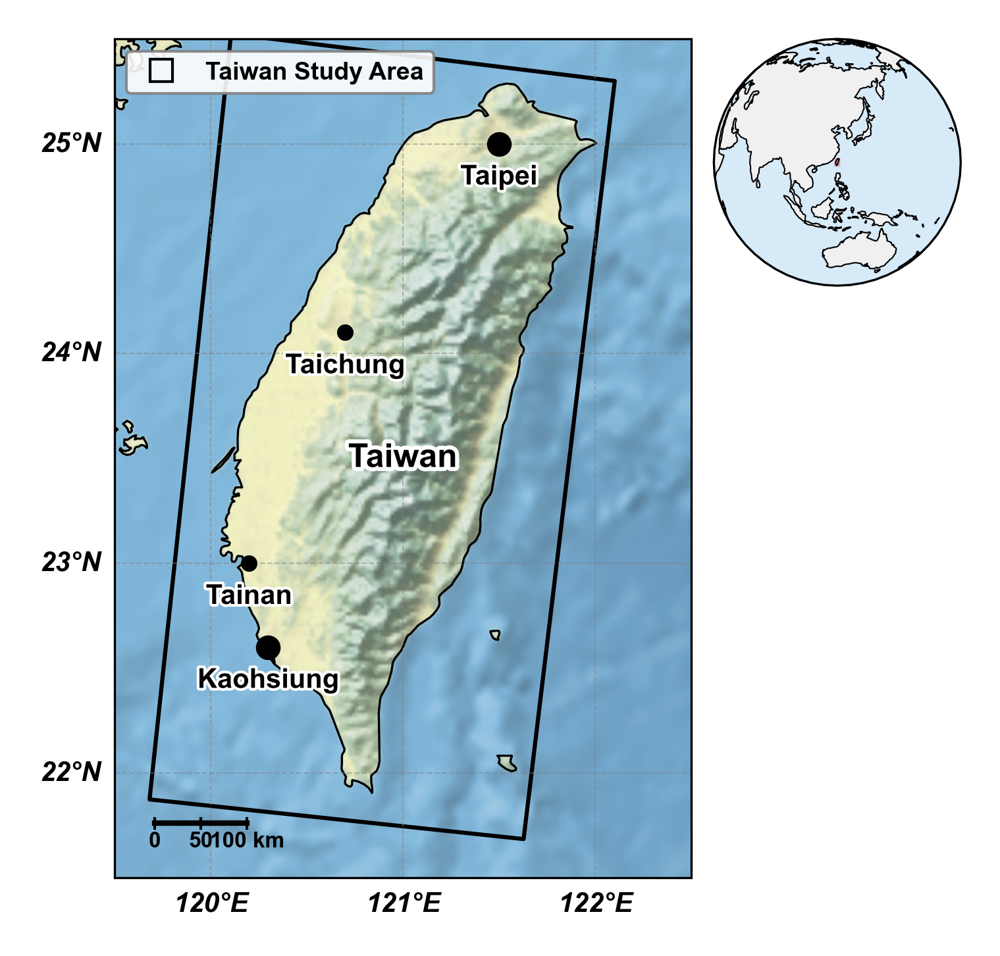

In [2]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
import geopandas as gpd
import numpy as np
import matplotlib.patheffects as PathEffects
from matplotlib.patches import FancyArrowPatch, Rectangle
import os
import warnings
import rasterio
from rasterio.plot import show
from rasterio.warp import calculate_default_transform, reproject, Resampling
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches

warnings.filterwarnings('ignore')  # 抑制不必要的警告

def create_research_map(
    taiwan_shp_path='D:\\OneDrive\\文档\\MATLAB 代码\\Para_Optimization_test\\DEM_data\\Taiwan.shp',
    natural_earth_path='C:\\Users\\Administrator\\Documents\\ArcGIS\\NE1_LR_LC_SR_W_DR.tif',
    output_path='location_map.png',
    figsize=(8, 5),
    dpi=300
):
    """
    创建台湾研究区位置图，使用Natural Earth I数据集作为底图
    使用地理坐标系(PlateCarree)来保持经纬度比例
    """
    # 设置字体
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 10
    
    # 设置地图范围（聚焦台湾区域）
    extent = [119.5, 122.5, 21.5, 25.5]
    
    # 创建图形
    fig = plt.figure(figsize=figsize, dpi=dpi)
    
    # 使用PlateCarree投影
    main_ax = plt.axes([0.05, 0.05, 0.9, 0.85], projection=ccrs.PlateCarree())
    main_ax.set_aspect('equal')
    main_ax.set_extent(extent, crs=ccrs.PlateCarree())
    
    # 加载 Natural Earth I 数据
    try:
        with rasterio.open(natural_earth_path) as src:
            ne_data = src.read()
            if src.count == 3:
                rgb_data = np.transpose(ne_data, (1, 2, 0))
                if rgb_data.max() > 1:
                    rgb_data = rgb_data / 255.0
                main_ax.imshow(
                    rgb_data, 
                    origin='upper', 
                    extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                    transform=ccrs.PlateCarree(),
                    interpolation='bilinear'
                )
            else:
                show(src, ax=main_ax, transform=ccrs.PlateCarree(), cmap='terrain')
    except Exception as e:
        print(f"Natural Earth I 数据加载失败: {e}")
        main_ax.add_feature(cfeature.LAND.with_scale('10m'), facecolor='#f8f8f8')
        main_ax.add_feature(cfeature.OCEAN.with_scale('10m'), facecolor='#d6eaf8')
    
    # 添加地理要素
    main_ax.add_feature(cfeature.COASTLINE.with_scale('10m'), linewidth=0.8, edgecolor='black')
    main_ax.add_feature(cfeature.BORDERS.with_scale('10m'), linewidth=0.5, edgecolor='gray', linestyle=':')
    
    # 加载并绘制台湾研究区
    try:
        taiwan_gdf = gpd.read_file(taiwan_shp_path)
        if taiwan_gdf.crs is None or taiwan_gdf.crs.to_string() != 'EPSG:4326':
            taiwan_gdf = taiwan_gdf.to_crs('EPSG:4326')
        taiwan_gdf.plot(
            ax=main_ax,
            facecolor='none',
            edgecolor='black',
            linewidth=1.5,
            transform=ccrs.PlateCarree()
        )
        
        # 添加台湾标签
        ax_text = main_ax.text(
            121.0, 23.5,
            'Taiwan',
            fontsize=12,
            weight='bold',
            ha='center',
            va='center',
            transform=ccrs.PlateCarree(),
            color='black'
        )
        ax_text.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='white')])
    except Exception as e:
        print(f"台湾研究区加载失败: {e}")
    
    # 添加主要城市
    major_cities = [
        (121.5, 25.0, 'Taipei', 'large'),    # 台北
        (120.3, 22.6, 'Kaohsiung', 'large'), # 高雄
        (120.7, 24.1, 'Taichung', 'medium'), # 台中
        (120.2, 23.0, 'Tainan', 'medium'),   # 台南
    ]
    
    for lon, lat, name, size in major_cities:
        marker_size = 8 if size == 'large' else 5
        main_ax.plot(lon, lat, 'o', color='black', markersize=marker_size, 
                    transform=ccrs.PlateCarree(), zorder=10)
        city_text = main_ax.text(
            lon, lat - 0.1, name, fontsize=10, ha='center', va='top',
            transform=ccrs.PlateCarree(), fontweight='bold'
        )
        city_text.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='white')])
    
    # 添加经纬度网格线
    gl = main_ax.gridlines(
        crs=ccrs.PlateCarree(), 
        draw_labels=True, 
        linewidth=0.5,
        color='gray', 
        alpha=0.5, 
        linestyle='--',
        x_inline=False, 
        y_inline=False
    )
    
    # 设置网格线间隔为1度
    gl.xlocator = plt.MultipleLocator(1)
    gl.ylocator = plt.MultipleLocator(1)
    gl.top_labels = False
    gl.right_labels = False
    
    # 添加比例尺
    scale_box = main_ax.inset_axes([0.05, 0.05, 0.2, 0.03], transform=main_ax.transAxes)
    scale_box.set_xlim(0, 1)
    scale_box.set_ylim(0, 1)
    scale_box.set_axis_off()
    
    scale_box.plot([0.1, 0.9], [0.5, 0.5], 'k-', linewidth=2)
    scale_box.plot([0.1, 0.1], [0.3, 0.7], 'k-', linewidth=1)
    scale_box.plot([0.5, 0.5], [0.3, 0.7], 'k-', linewidth=1)
    scale_box.plot([0.9, 0.9], [0.3, 0.7], 'k-', linewidth=1)
    
    scale_box.text(0.1, 0.2, '0', ha='center', va='top', fontsize=8)
    scale_box.text(0.5, 0.2, '50', ha='center', va='top', fontsize=8)
    scale_box.text(0.9, 0.2, '100 km', ha='center', va='top', fontsize=8)
    
    # 添加全球视图的小地图
    inset_ax = plt.axes([0.65, 0.65, 0.25, 0.25], 
                       projection=ccrs.Orthographic(central_longitude=121, central_latitude=23.5))
    inset_ax.set_global()
    
    inset_ax.add_feature(cfeature.LAND, facecolor='#f0f0f0')
    inset_ax.add_feature(cfeature.OCEAN, facecolor='#d6eaf8')
    inset_ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='black')
    
    # 高亮显示主图显示区域
    highlight_poly = Rectangle(
        (extent[0], extent[2]), 
        extent[1]-extent[0], 
        extent[3]-extent[2],
        facecolor='red', 
        alpha=0.3, 
        transform=ccrs.PlateCarree()
    )
    inset_ax.add_patch(highlight_poly)
    
    # 添加图例
    legend_elements = [
        Line2D([0], [0], color='black', marker='s', markersize=8, 
               markerfacecolor='none', markeredgecolor='black', 
               lw=0, label='Taiwan Study Area')
    ]
    
    main_ax.legend(
        handles=legend_elements, 
        loc='upper left', 
        frameon=True,
        facecolor='white', 
        edgecolor='gray', 
        framealpha=0.9, 
        fontsize=9
    )
    
    # 设置坐标轴标签
    main_ax.set_xlabel('Longitude (°E)', fontsize=10, weight='bold')
    main_ax.set_ylabel('Latitude (°N)', fontsize=10, weight='bold')
    gl.xlabel_style = {'size': 10, 'weight': 'bold', 'style': 'italic', 'fontname': 'Arial'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold', 'style': 'italic', 'fontname': 'Arial'}
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    print(f"地图已保存至: {output_path}")
    plt.show()
    
    return output_path

if __name__ == "__main__":
    create_research_map(
        taiwan_shp_path='D:\\OneDrive\\文档\\MATLAB 代码\\Para_Optimization_test\\DEM_data\\Taiwan.shp',
        natural_earth_path=r"C:\Users\Administrator\Documents\ArcGIS\NE1_HR_LC_SR_W.tif",
        output_path='taiwan_location_map.png'
    )

Natural Earth 数据信息: 宽度=21600, 高度=10800, 波段数=3
坐标系: EPSG:4326
Natural Earth I 数据加载成功
地图已保存至: lms_location_map.png


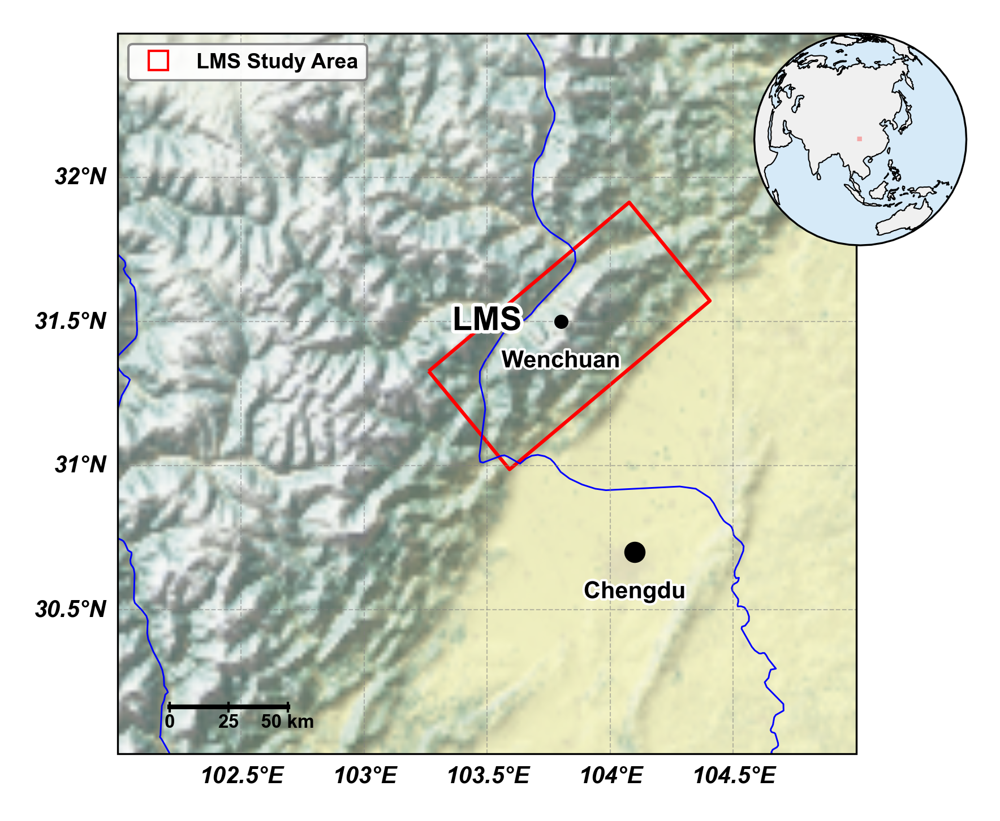

In [3]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader
import geopandas as gpd
import numpy as np
import matplotlib.patheffects as PathEffects
from matplotlib.patches import FancyArrowPatch, Rectangle
import os
import warnings
import rasterio
from rasterio.plot import show
from rasterio.warp import calculate_default_transform, reproject, Resampling
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches

warnings.filterwarnings('ignore')  # 抑制不必要的警告

def create_research_map(
    lms_shp_path='D:\\OneDrive\\文档\\MATLAB 代码\\Para_Optimization_test\\DEM_data\\LMS_Study_Area.shp',
    natural_earth_path='C:\\Users\\Administrator\\Documents\\ArcGIS\\NE1_LR_LC_SR_W_DR.tif',
    output_path='location_map.png',
    figsize=(8, 5),
    dpi=300
):
    """
    创建龙门山研究区位置图，使用Natural Earth I数据集作为底图
    使用地理坐标系(PlateCarree)来保持经纬度比例
    """
    # 设置字体
    plt.rcParams['font.family'] = 'Arial'
    plt.rcParams['font.size'] = 10
    
    # 设置地图范围（适合龙门山区域）
    extent = [102, 105, 30, 32.5]
    
    # 创建图形
    fig = plt.figure(figsize=figsize, dpi=dpi)
    
    # 使用PlateCarree投影
    main_ax = plt.axes([0.05, 0.05, 0.9, 0.85], projection=ccrs.PlateCarree())
    main_ax.set_aspect('equal')
    main_ax.set_extent(extent, crs=ccrs.PlateCarree())
    
    # 加载 Natural Earth I 数据
    try:
        with rasterio.open(natural_earth_path) as src:
            print(f"Natural Earth 数据信息: 宽度={src.width}, 高度={src.height}, 波段数={src.count}")
            print(f"坐标系: {src.crs}")
            
            ne_data = src.read()
            if src.count == 3:
                rgb_data = np.transpose(ne_data, (1, 2, 0))
                if rgb_data.max() > 1:
                    rgb_data = rgb_data / 255.0
                main_ax.imshow(
                    rgb_data, 
                    origin='upper', 
                    extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                    transform=ccrs.PlateCarree(),
                    interpolation='bilinear'
                )
            else:
                show(src, ax=main_ax, transform=ccrs.PlateCarree(), cmap='terrain')
            print("Natural Earth I 数据加载成功")
    except Exception as e:
        print(f"Natural Earth I 数据加载失败: {e}")
        main_ax.add_feature(cfeature.LAND.with_scale('50m'), facecolor='#f8f8f8', edgecolor='none')
        main_ax.add_feature(cfeature.OCEAN.with_scale('50m'), facecolor='#d6eaf8', edgecolor='none')
    
    # 添加基础地理要素
    main_ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.8, edgecolor='black')
    main_ax.add_feature(cfeature.BORDERS.with_scale('50m'), linewidth=0.5, edgecolor='gray', linestyle=':')
    main_ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.3, edgecolor='#aaaaaa', linestyle='--')
    
    # 加载河流数据
    rivers_feature = cfeature.NaturalEarthFeature(
        category='physical',
        name='rivers_lake_centerlines',
        scale='10m',
        facecolor='none',
        edgecolor='blue'
    )
    main_ax.add_feature(rivers_feature, linewidth=0.7)
    
    # 加载并绘制龙门山研究区
    try:
        lms_gdf = gpd.read_file(lms_shp_path)
        if lms_gdf.crs is None or lms_gdf.crs.to_string() != 'EPSG:4326':
            lms_gdf = lms_gdf.to_crs('EPSG:4326')
        lms_gdf.plot(
            ax=main_ax,
            facecolor='none',
            edgecolor='red',
            linewidth=1.5,
            transform=ccrs.PlateCarree()
        )
        
        # 添加LMS标签
        lms_text = main_ax.text(
            103.5, 31.5,
            'LMS',
            fontsize=14,
            weight='bold',
            ha='center',
            va='center',
            transform=ccrs.PlateCarree(),
            color='black'
        )
        lms_text.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='white')])
    except Exception as e:
        print(f"龙门山研究区加载失败: {e}")
    
    # 添加主要城市
    major_cities = [
        (104.1, 30.7, 'Chengdu', 'large'),    # 成都
        (103.8, 31.5, 'Wenchuan', 'small'),   # 汶川
    ]
    
    for lon, lat, name, size in major_cities:
        marker_size = 8 if size == 'large' else 5
        main_ax.plot(lon, lat, 'o', color='black', markersize=marker_size, transform=ccrs.PlateCarree(), zorder=10)
        city_text = main_ax.text(
            lon, lat - 0.1, name, fontsize=10, ha='center', va='top',
            transform=ccrs.PlateCarree(), fontweight='bold'
        )
        city_text.set_path_effects([PathEffects.withStroke(linewidth=2, foreground='white')])
    
    # 添加经纬度网格线
    gl = main_ax.gridlines(
        crs=ccrs.PlateCarree(), 
        draw_labels=True, 
        linewidth=0.5,
        color='gray', 
        alpha=0.5, 
        linestyle='--',
        x_inline=False, 
        y_inline=False
    )
    
    # 设置网格线间隔为0.5度
    gl.xlocator = plt.MultipleLocator(0.5)
    gl.ylocator = plt.MultipleLocator(0.5)
    gl.top_labels = False
    gl.right_labels = False
    
    # 添加比例尺
    scale_box = main_ax.inset_axes([0.05, 0.05, 0.2, 0.03], transform=main_ax.transAxes)
    scale_box.set_xlim(0, 1)
    scale_box.set_ylim(0, 1)
    scale_box.set_axis_off()
    
    scale_box.plot([0.1, 0.9], [0.5, 0.5], 'k-', linewidth=2)
    scale_box.plot([0.1, 0.1], [0.3, 0.7], 'k-', linewidth=1)
    scale_box.plot([0.5, 0.5], [0.3, 0.7], 'k-', linewidth=1)
    scale_box.plot([0.9, 0.9], [0.3, 0.7], 'k-', linewidth=1)
    
    scale_box.text(0.1, 0.2, '0', ha='center', va='top', fontsize=8)
    scale_box.text(0.5, 0.2, '25', ha='center', va='top', fontsize=8)
    scale_box.text(0.9, 0.2, '50 km', ha='center', va='top', fontsize=8)
    
    # 添加全球视图的小地图
    inset_ax = plt.axes([0.65, 0.65, 0.25, 0.25], projection=ccrs.Orthographic(central_longitude=104, central_latitude=31))
    inset_ax.set_global()
    
    inset_ax.add_feature(cfeature.LAND, facecolor='#f0f0f0')
    inset_ax.add_feature(cfeature.OCEAN, facecolor='#d6eaf8')
    inset_ax.add_feature(cfeature.COASTLINE, linewidth=0.5, edgecolor='black')
    
    highlight_poly = Rectangle(
        (extent[0], extent[2]), 
        extent[1]-extent[0], 
        extent[3]-extent[2],
        facecolor='red', 
        alpha=0.3, 
        transform=ccrs.PlateCarree()
    )
    inset_ax.add_patch(highlight_poly)
    
    # 添加图例
    legend_elements = [
        Line2D([0], [0], color='red', marker='s', markersize=8, markerfacecolor='none',
               markeredgecolor='red', lw=0, label='LMS Study Area')
    ]

    main_ax.legend(
        handles=legend_elements, 
        loc='upper left', 
        frameon=True,
        facecolor='white', 
        edgecolor='gray', 
        framealpha=0.9, 
        fontsize=9
    )
    
    # 设置坐标轴标签
    main_ax.set_xlabel('Longitude (°E)', fontsize=10, weight='bold')
    main_ax.set_ylabel('Latitude (°N)', fontsize=10, weight='bold')
    gl.xlabel_style = {'size': 10, 'weight': 'bold', 'style': 'italic', 'fontname': 'Arial'}
    gl.ylabel_style = {'size': 10, 'weight': 'bold', 'style': 'italic', 'fontname': 'Arial'}
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(output_path, dpi=dpi, bbox_inches='tight')
    print(f"地图已保存至: {output_path}")
    
    plt.show()
    return output_path

if __name__ == "__main__":
    create_research_map(
        lms_shp_path='D:\\OneDrive\\文档\\MATLAB 代码\\Para_Optimization_test\\DEM_data\\LMS_Study_Area.shp',
        natural_earth_path=r"C:\Users\Administrator\Documents\ArcGIS\NE1_HR_LC_SR_W.tif",
        output_path='lms_location_map.png'
    )